In [1]:
import plot
import importlib
import numpy as np
import random
import os
import glob
import h5py
import math
import scipy
import random
import classify
import warnings
import preprocess
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from os import path
from scipy import stats
from scipy.io import loadmat
from matplotlib import gridspec
from numpy.linalg import norm
from scipy.spatial import distance
from sklearn import decomposition
from matplotlib.colors import LinearSegmentedColormap
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

np.random.seed(42)
random.seed(42)


In [2]:

# reload when updating code
importlib.reload(preprocess)
# mouse and date

mice = ['NN11'] 
dates_per_mouse = {'NN11': ['210626']}

for mouse in mice:
    dates = dates_per_mouse[mouse]  # Get the list of dates for the current mouse
    days = len(dates)  # Correct number of days for this mouse
    
    for day_idx, date in enumerate(dates):
        print(mouse, date)
        
        # Create folders to save files
        paths = preprocess.create_folders(mouse, date)
        print('folders created')
        
        # Import data for mouse and date as dict
        session_data = preprocess.load_data(paths)
        print('data loaded')
        
        # Process and plot behavior
        behavior = preprocess.process_behavior(session_data, paths)
        print('behavior done')
        
        # Save masks so can run in Matlab to process other planes
        # preprocess.cell_masks(paths, 0)
        print('masks saved')
        
        # Grab activity
        deconvolved = preprocess.process_activity(paths, 'spks', 3, 0)
        print('activity processed')
        
        # Normalize activity
        norm_deconvolved = preprocess.normalize_deconvolved(deconvolved, behavior, paths, 0)
        print('activity normalized')
        
        # Gaussian filter activity
        norm_moving_deconvolved_filtered = preprocess.difference_gaussian_filter(norm_deconvolved, 4, behavior, paths, 0)
        print('activity filtered')
        
        # Make trial-averaged traces and baseline subtract
        mean_cs_1_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_1')
        mean_cs_2_responses_df = preprocess.normalized_trial_averaged(norm_deconvolved, behavior, 'cs_2')
        print('traces done')
        
        # Get significant cells
        [cs_1_poscells, cs_1_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_1')
        [cs_2_poscells, cs_2_negcells] = preprocess.sig_test(norm_deconvolved, behavior, 'cs_2')
        [both_poscells, both_sigcells] = preprocess.combine_sig(cs_1_poscells, cs_1_negcells, cs_2_poscells, cs_2_negcells)
        print('sig cells done')
        
        # Get index of top cell differences
        idx = preprocess.get_index(behavior, mean_cs_1_responses_df, mean_cs_2_responses_df, cs_1_poscells, cs_2_poscells, both_poscells, both_sigcells, paths, 1)
        print('idx done')
        
        # Get prior for synchronous cue activity
        prior = classify.prior(norm_moving_deconvolved_filtered, idx['cs_1'], idx['cs_2'], behavior, [])
        print('prior done')
        
        # Logistic regression
        y_pred_log = classify.log_regression(behavior, norm_deconvolved, norm_moving_deconvolved_filtered, both_poscells, prior)
        print('logistic regression done')
        
        # Process classified output
        y_pred = classify.process_classified(y_pred_log, prior, paths, 1)
        print('classified done')
    


NN11 210626
folders created
data loaded
behavior done
masks saved
activity processed
activity normalized
activity filtered
traces done
sig cells done
idx done
prior done
logistic regression done
classified done


In [68]:
activity = norm_deconvolved.to_numpy()
activity = activity[idx['both'].index]

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

print(len(mean_activity_cs_1)) #trials x neurons

68


In [4]:
import numpy as np
cos_sim = lambda a, b: np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
topn = 0.05

# Commented out code for filtering significant reactivated cells.
# sig_cells = preprocess.sig_reactivated_cells([], [], [], [], [], paths, 0)
# activity = activity[sig_cells > 0, :]

# Initialize lists to store mean activities and onsets for two different cues.
mean_activity_cs_1 = []
mean_activity_cs_2 = []
mean_activity_cs_any = []
onsets_cs_1 = []
onsets_cs_2 = []

# Loop over each onset and offset in behavior data.
for i in range(0, len(behavior['onsets'])):
    # Calculate the mean activity for the given onset to offset period.
    temp_activity = np.mean(activity[:, int(behavior['onsets'][i]):int(behavior['offsets'][i]) + 1], axis=1)
    # Check if the cue code matches cs_1_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_1_code']:
        mean_activity_cs_1.append(temp_activity)
        onsets_cs_1.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)
    # Check if the cue code matches cs_2_code, and store the mean activity and onset.
    if behavior['cue_codes'][i] == behavior['cs_2_code']:
        mean_activity_cs_2.append(temp_activity)
        onsets_cs_2.append(behavior['onsets'][i])
        mean_activity_cs_any.append(temp_activity)

# Normalize the mean activities for each trial.
mean_activity_cs_1 = mean_activity_cs_1 / np.mean(mean_activity_cs_any, axis=0)
mean_activity_cs_2 = mean_activity_cs_2 / np.mean(mean_activity_cs_any, axis=0)

mean_activity_cs_1 = np.stack(mean_activity_cs_1, axis=0)
mean_activity_cs_2 = np.stack(mean_activity_cs_2, axis=0)

# Calculate the mean of the first and last three mean activities for cs_1 and cs_2.
n_centroids = 3
mean_activity_cs_1_mean = [np.mean(mean_activity_cs_1[0:n_centroids], axis=0), np.mean(mean_activity_cs_1[len(mean_activity_cs_1) - n_centroids:len(mean_activity_cs_1)], axis=0)]
mean_activity_cs_2_mean = [np.mean(mean_activity_cs_2[0:n_centroids], axis=0), np.mean(mean_activity_cs_2[len(mean_activity_cs_2) - n_centroids:len(mean_activity_cs_2)], axis=0)]

# Calculate the difference vectors between the early and late mean activities for cs_1 and cs_2.
mean_activity_cs_1_vec = mean_activity_cs_1_mean[1] - mean_activity_cs_1_mean[0]
mean_activity_cs_2_vec = mean_activity_cs_2_mean[1] - mean_activity_cs_2_mean[0]

late_trails_1 = mean_activity_cs_1_mean[1]
top_n_percent_indices_1 = np.argsort(late_trails_1)[-int(len(late_trails_1) * topn):]
mean_activity_cstopn_1 = mean_activity_cs_1[:, top_n_percent_indices_1]
mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

late_trails_2 = mean_activity_cs_2_mean[1]
top_n_percent_indices_2 = np.argsort(late_trails_2)[-int(len(late_trails_2) * topn):]
mean_activity_cstopn_2 = mean_activity_cs_2[:, top_n_percent_indices_2]
mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

sim_cs_1 = np.zeros(len(mean_activity_cs_1))
sim_cs_2 = np.zeros(len(mean_activity_cs_2))

# Normalize the mean activities for each trial using the difference vectors.
for i in range(0, len(mean_activity_cs_1)):
    sim_cs_1[i] = cos_sim(mean_activity_cstopn_1[i], mean_activity_cstopn_1_late)
    # sim_cs_1[i] = cos_sim(mean_activity_cs_1[i], mean_activity_cs_1_mean[1])
    # sim_cs_1[i] = np.dot(mean_activity_cs_1[i], mean_activity_cs_1_vec) / np.linalg.norm(mean_activity_cs_1_vec)
for i in range(0, len(mean_activity_cs_2)):
    sim_cs_2[i] = cos_sim(mean_activity_cstopn_2[i], mean_activity_cstopn_2_late)
    # sim_cs_2[i] = cos_sim(mean_activity_cs_2[i], mean_activity_cs_2_mean[1])
    # sim_cs_2[i] = np.dot(mean_activity_cs_2[i], mean_activity_cs_2_vec) / np.linalg.norm(mean_activity_cs_2_vec)


In [5]:

# Initialize lists to store mean activities and trial indices for reactivation events.
mean_activity_r_1 = []
mean_activity_r_2 = []
mean_activity_r_any = []
trial_r_1 = []
trial_r_2 = []

# Copy reactivation predictions for cs_1 and cs_2.
reactivation_cs_1 = y_pred[:, 0].copy()
reactivation_cs_2 = y_pred[:, 1].copy()

# Set a threshold for reactivation probability.
p_threshold = .75

# Initialize variables for reactivation event detection.
cs_1_peak = 0
cs_2_peak = 0
i = 0
next_r = 0

# Loop through reactivation predictions to detect reactivation events.
while i < len(reactivation_cs_1) - 1:
    # Check if there is a reactivation event.
    if reactivation_cs_1[i] > 0 or reactivation_cs_2[i] > 0:
        if next_r == 0:
            r_start = i
            next_r = 1
        # Update peak reactivation values.
        if reactivation_cs_1[i] > cs_1_peak:
            cs_1_peak = reactivation_cs_1[i]
        if reactivation_cs_2[i] > cs_2_peak:
            cs_2_peak = reactivation_cs_2[i]
        #print(reactivation_cs_1[i + 1], reactivation_cs_2[i + 1])
        # Check if the reactivation event has ended.
        if reactivation_cs_1[i + 1] <= 0.001 and reactivation_cs_2[i + 1]<= 0.001:
            r_end = i + 1
            next_r = 0
            # Store mean activity and trial index for cs_1 reactivation events above the threshold.
            if cs_1_peak > p_threshold:
                for j in range(0, len(onsets_cs_1)):
                    if r_start < onsets_cs_1[j] and r_start > onsets_cs_1[j-1] and r_start < onsets_cs_1[j-1] + int(behavior['framerate']*61):
                        mean_activity_r_1.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_1.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Store mean activity and trial index for cs_2 reactivation events above the threshold.
            if cs_2_peak > p_threshold:
                for j in range(0, len(onsets_cs_2)):
                    if r_start < onsets_cs_2[j] and r_start > onsets_cs_2[j-1] and r_start < onsets_cs_2[j-1] + int(behavior['framerate']*61):
                        mean_activity_r_2.append(np.mean(activity[:, r_start:r_end], axis=1))
                        trial_r_2.append(j-1)
                        mean_activity_r_any.append(np.mean(activity[:, r_start:r_end], axis=1))
                        break
            # Reset variables for the next reactivation event.
            i = r_end
            cs_1_peak = 0
            cs_2_peak = 0
    i += 1


In [6]:

# Normalize the reactivation mean activities.
# mean_activity_r_1 = mean_activity_r_1 / np.mean(mean_activity_r_any, axis=0)
# mean_activity_r_2 = mean_activity_r_2 / np.mean(mean_activity_r_any, axis=0)

mean_activity_r_1 = np.stack(mean_activity_r_1, axis=0)
mean_activity_r_2 = np.stack(mean_activity_r_2, axis=0)

# mean_activity_rtopn_1 = mean_activity_r_1[:, top_n_percent_indices_1]
# mean_activity_cstopn_1_late = mean_activity_cs_1_mean[1][top_n_percent_indices_1]

# mean_activity_rtopn_2 = mean_activity_r_2[:, top_n_percent_indices_2]
# mean_activity_cstopn_2_late = mean_activity_cs_2_mean[1][top_n_percent_indices_2]

sim_r_1 = np.zeros(len(mean_activity_r_1))
sim_r_2 = np.zeros(len(mean_activity_r_2))

sim_r_1_random = np.zeros(len(mean_activity_r_1))

zero_indices = np.where(mean_activity_r_1 != 0)
    
# Normalize the reactivation mean activities using the difference vectors.
for i in range(0, len(mean_activity_r_1)):
    # nonzero_indices = np.where(mean_activity_r_1[i] != 0)
    top_n_percent_indices_r_1 = np.argsort(mean_activity_r_1[i])[-int(len(mean_activity_r_1[i]) * topn):]
    sim_r_1[i] = cos_sim(mean_activity_r_1[i][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)], mean_activity_cs_1_mean[1][np.intersect1d(top_n_percent_indices_r_1, top_n_percent_indices_1)])
    
    chosen_indices = np.random.randint(0, len(mean_activity_r_1[i]), 27)
    sim_r_1_random[i] = cos_sim(mean_activity_r_1[i][chosen_indices], mean_activity_cs_1_mean[1][chosen_indices])
    # sim_r_1[i] = cos_sim(mean_activity_rtopn_1[i], mean_activity_cstopn_1_late)
    # sim_r_1[i] = cos_sim(mean_activity_r_1[i], mean_activity_cs_1_mean[1])
    # sim_r_1[i] = np.dot(mean_activity_r_1[i], mean_activity_cs_1_vec) / np.linalg.norm(mean_activity_cs_1_vec)
for i in range(0, len(mean_activity_r_2)):
    # nonzero_indices = np.where(mean_activity_r_2[i] != 0)
    top_n_percent_indices_r_2 = np.argsort(mean_activity_r_2[i])[-int(len(mean_activity_r_2[i]) * topn):]
    sim_r_2[i] = cos_sim(mean_activity_r_2[i][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)], mean_activity_cs_2_mean[1][np.intersect1d(top_n_percent_indices_r_2, top_n_percent_indices_2)])
    # sim_r_2[i] = cos_sim(mean_activity_rtopn_2[i], mean_activity_cstopn_2_late)
    # sim_r_2[i] = cos_sim(mean_activity_r_2[i], mean_activity_cs_2_mean[1])
    # sim_r_2[i] = np.dot(mean_activity_r_2[i], mean_activity_cs_2_vec) / np.linalg.norm(mean_activity_cs_2_vec)

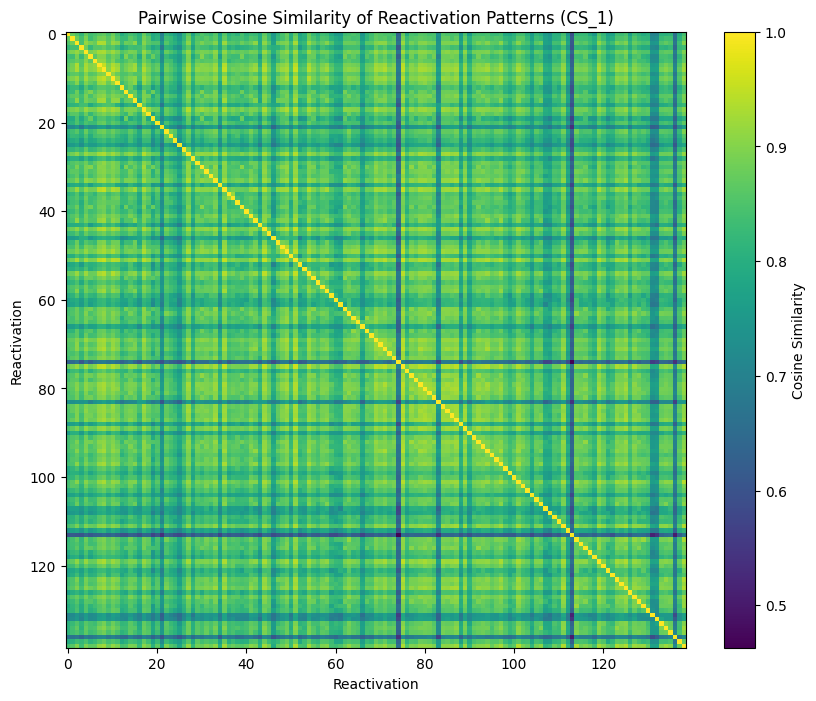

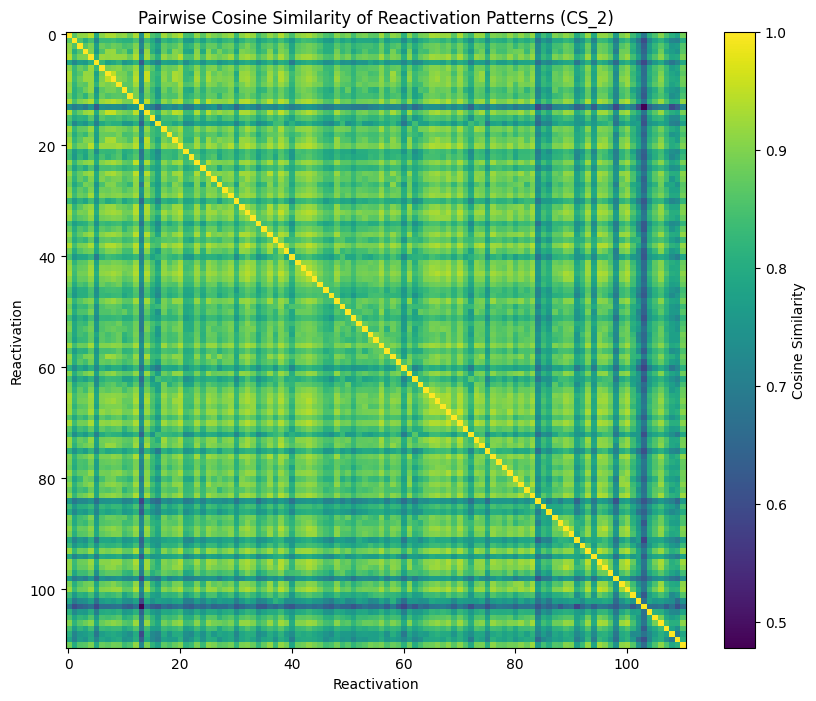

In [7]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute pairwise cosine similarity of reactivation patterns
similarity_matrix_cs_1 = cosine_similarity(mean_activity_r_1)
similarity_matrix_cs_2 = cosine_similarity(mean_activity_r_2)

plt.figure(figsize=(10, 8))
plt.title("Pairwise Cosine Similarity of Reactivation Patterns (CS_1)")
plt.imshow(similarity_matrix_cs_1, cmap="viridis", aspect="auto")
plt.colorbar(label="Cosine Similarity")
plt.xlabel("Reactivation")
plt.ylabel("Reactivation")
plt.show()

plt.figure(figsize=(10, 8))
plt.title("Pairwise Cosine Similarity of Reactivation Patterns (CS_2)")
plt.imshow(similarity_matrix_cs_2, cmap="viridis", aspect="auto")
plt.colorbar(label="Cosine Similarity")
plt.xlabel("Reactivation")
plt.ylabel("Reactivation")
plt.show()



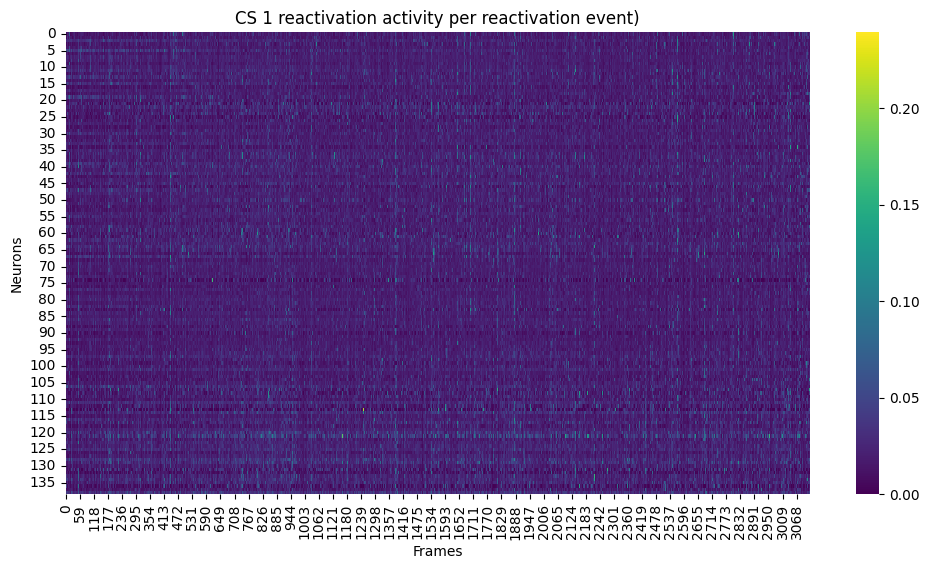

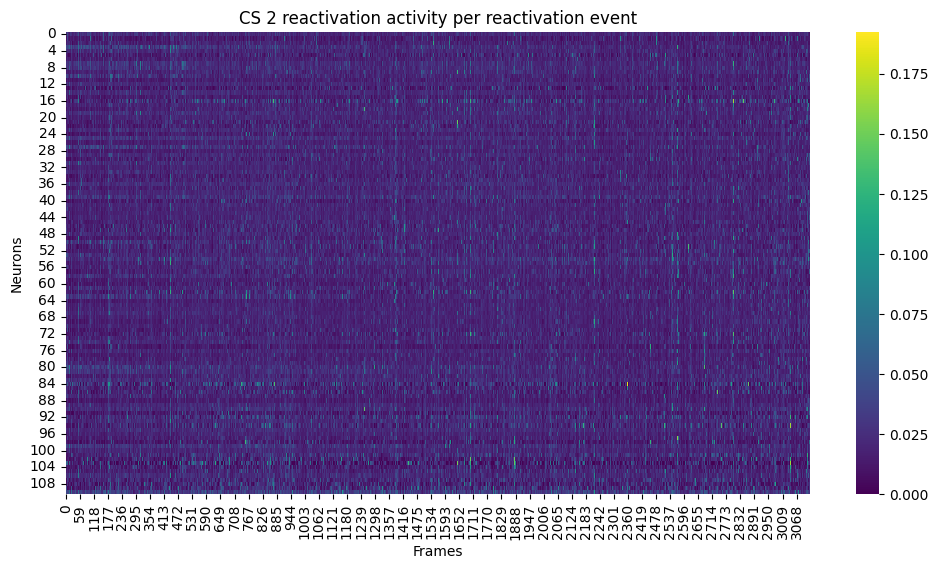

In [8]:

# Heatmap for CS_1 Reactivations
plt.figure(figsize=(12, 6))
sns.heatmap(mean_activity_r_1, cmap="viridis", cbar=True)
plt.title("CS 1 reactivation activity per reactivation event)")
plt.xlabel("Frames")
plt.ylabel("Neurons")
plt.show()

# Heatmap for CS_2 Reactivations
plt.figure(figsize=(12, 6))
sns.heatmap(mean_activity_r_2, cmap="viridis", cbar=True)
plt.title("CS 2 reactivation activity per reactivation event")
plt.xlabel("Frames")
plt.ylabel("Neurons")
plt.show()


# Structural Analysis of Reactivations

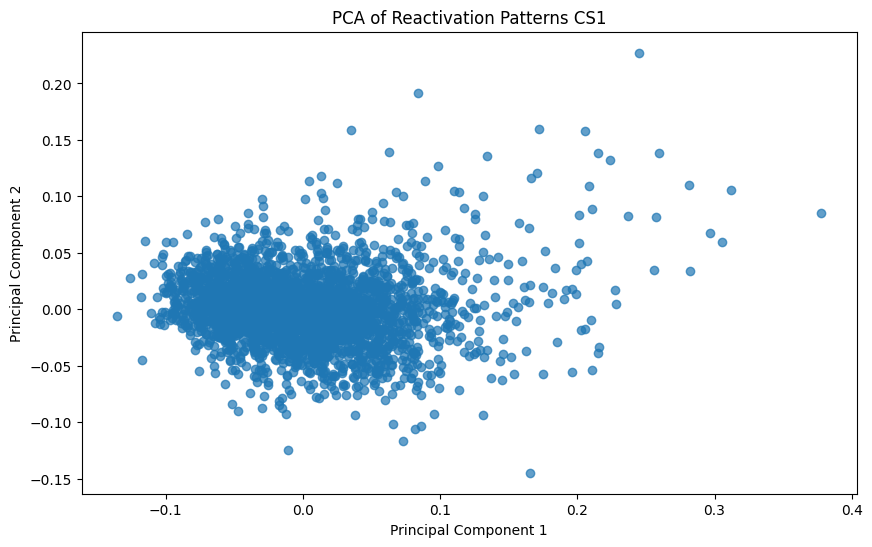

[0.16898446 0.05191163]


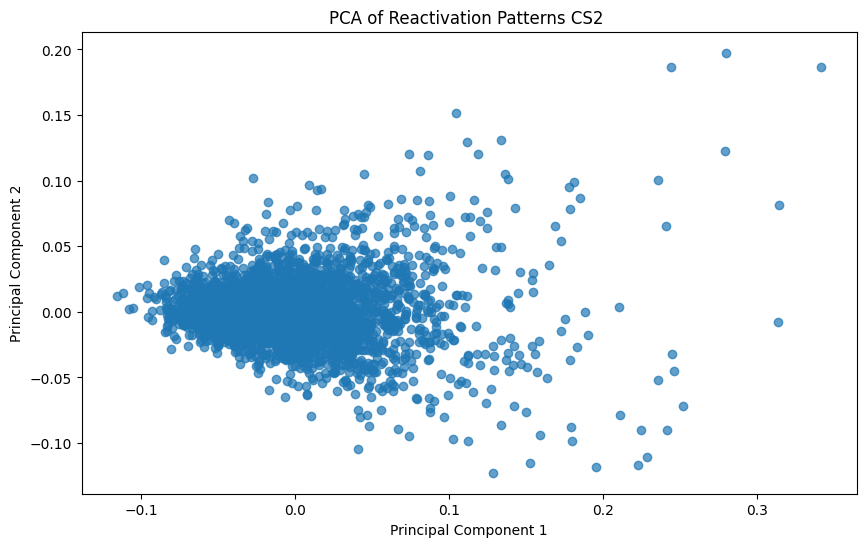

[0.1806232  0.04980929]


In [9]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reactivations_pca1 = pca.fit_transform(mean_activity_r_1.T)

# Plot the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca1[:, 0], reactivations_pca1[:, 1], alpha=0.7)
plt.title("PCA of Reactivation Patterns CS1")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

print(pca.explained_variance_ratio_)

reactivations_pca2 = pca.fit_transform(mean_activity_r_2.T)

# Plot the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca2[:, 0], reactivations_pca2[:, 1], alpha=0.7)
plt.title("PCA of Reactivation Patterns CS2 ")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

print(pca.explained_variance_ratio_)

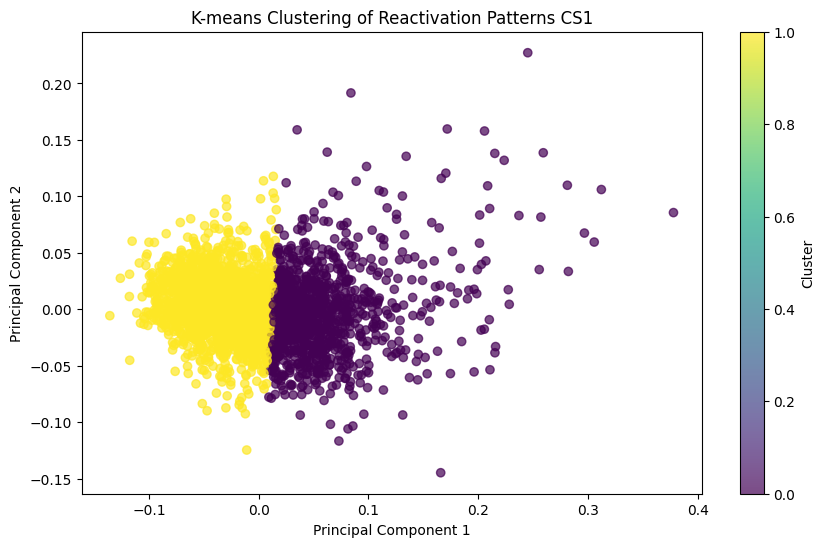

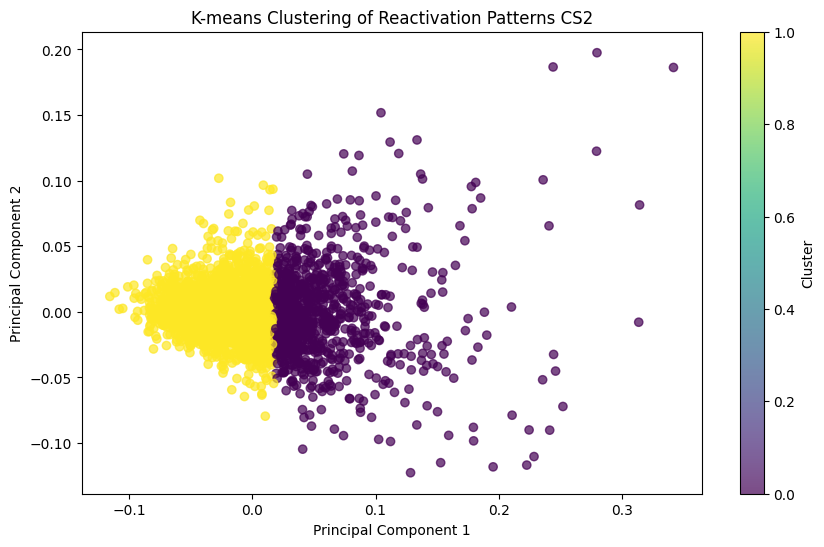

In [10]:
from sklearn.cluster import KMeans

# Apply K-means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(reactivations_pca1)

# Plot clusters
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca1[:, 0], reactivations_pca1[:, 1], c=clusters, cmap="viridis", alpha=0.7)
plt.title("K-means Clustering of Reactivation Patterns CS1")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster")
plt.show()

kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(reactivations_pca2)

# Plot clusters
plt.figure(figsize=(10, 6))
plt.scatter(reactivations_pca2[:, 0], reactivations_pca2[:, 1], c=clusters, cmap="viridis", alpha=0.7)
plt.title("K-means Clustering of Reactivation Patterns CS2")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster")
plt.show()



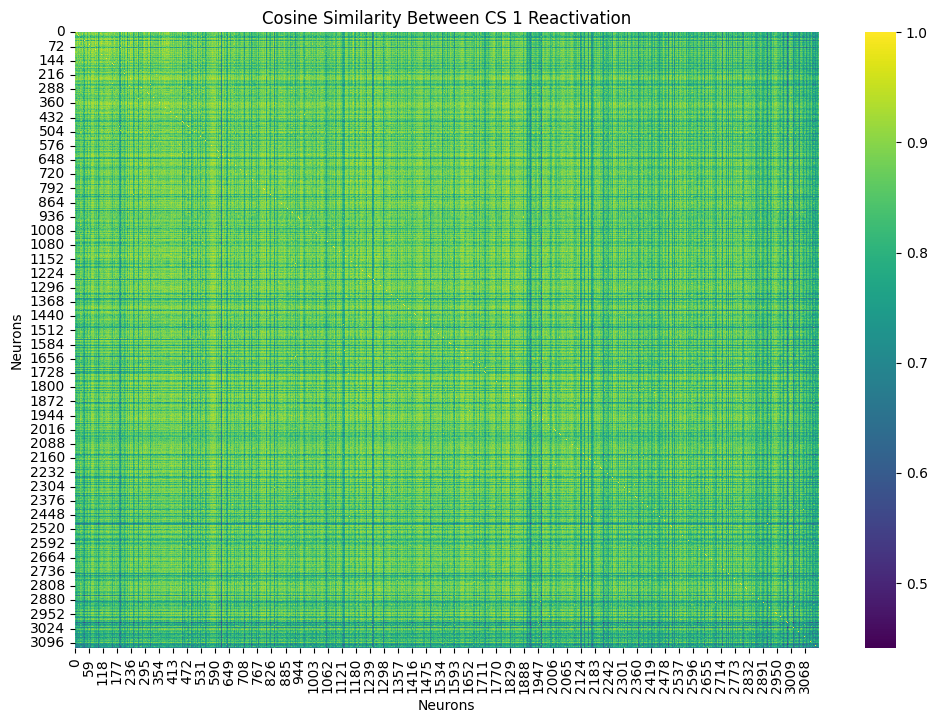

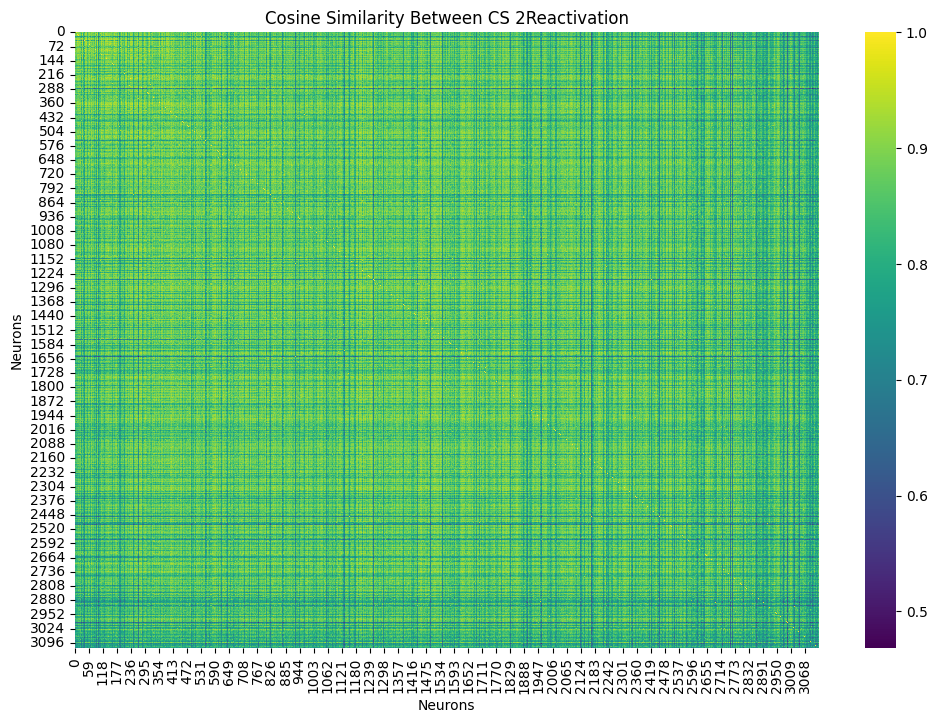

In [11]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity
similarity_matrix1 = cosine_similarity(mean_activity_r_1.T)

# Plot similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix1, cmap="viridis", cbar=True)
plt.title("Cosine Similarity Between CS 1 Reactivation")
plt.xlabel("Neurons")
plt.ylabel("Neurons")
plt.show()

# Compute cosine similarity
similarity_matrix2 = cosine_similarity(mean_activity_r_2.T)

# Plot similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(similarity_matrix2, cmap="viridis", cbar=True)
plt.title("Cosine Similarity Between CS 2Reactivation")
plt.xlabel("Neurons")
plt.ylabel("Neurons")
plt.show()



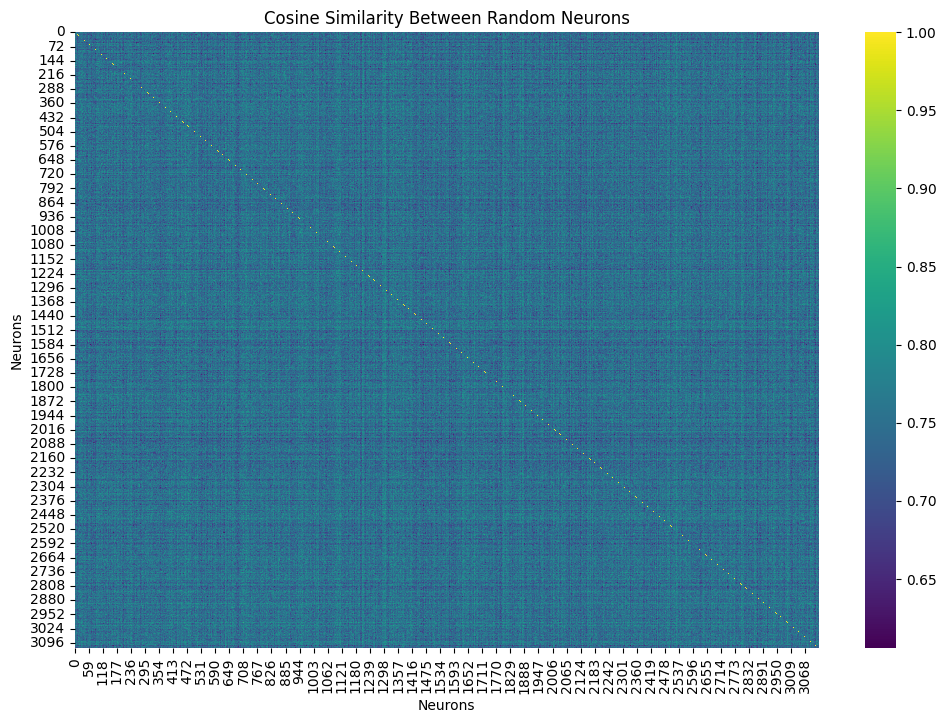

In [12]:
# Generate random data
random_data = np.random.rand(*mean_activity_r_1.shape)

# Compute cosine similarity for random data
random_similarity_matrix = cosine_similarity(random_data.T)

# Plot random similarity matrix
plt.figure(figsize=(12, 8))
sns.heatmap(random_similarity_matrix, cmap="viridis", cbar=True)
plt.title("Cosine Similarity Between Random Neurons")
plt.xlabel("Neurons")
plt.ylabel("Neurons")
plt.show()


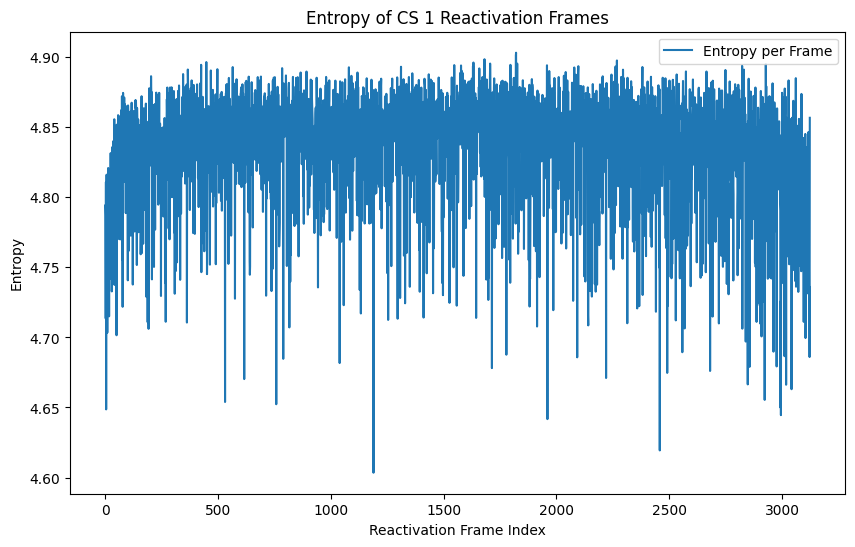

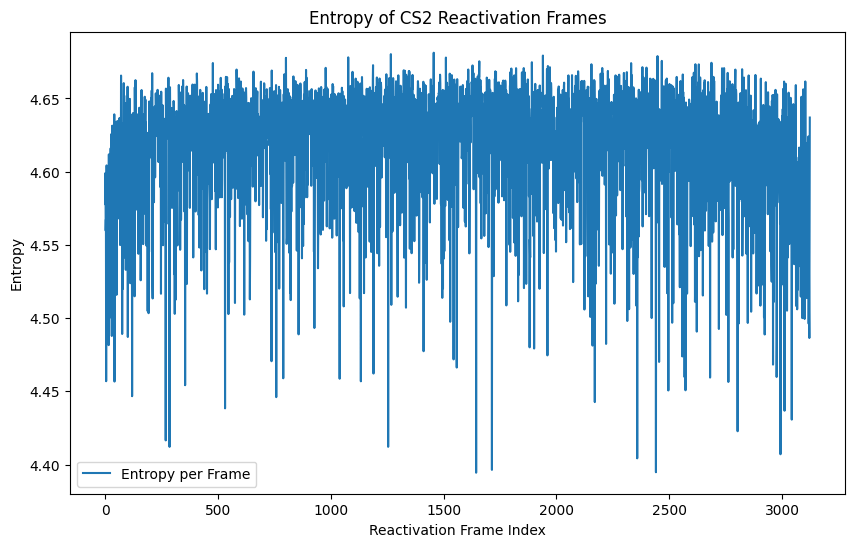

In [13]:
from scipy.stats import entropy

# Compute entropy for each frame
frame_entropy = entropy(mean_activity_r_1, axis=0)

# Plot entropy
plt.figure(figsize=(10, 6))
plt.plot(frame_entropy, label="Entropy per Frame")
plt.title("Entropy of CS 1 Reactivation Frames")
plt.xlabel("Reactivation Frame Index")
plt.ylabel("Entropy")
plt.legend()
plt.show()

from scipy.stats import entropy

frame_entropy = entropy(mean_activity_r_2, axis=0)

# Plot entropy
plt.figure(figsize=(10, 6))
plt.plot(frame_entropy, label="Entropy per Frame")
plt.title("Entropy of CS2 Reactivation Frames")
plt.xlabel("Reactivation Frame Index")
plt.ylabel("Entropy")
plt.legend()
plt.show()



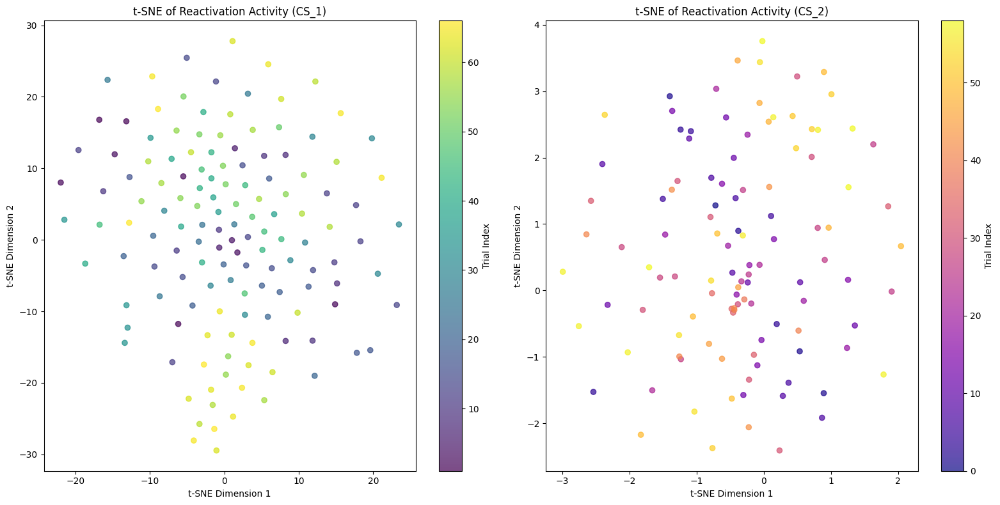

In [14]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Standardize CS_1 and CS_2 separately
scaler = StandardScaler()
standardized_r_1 = scaler.fit_transform(mean_activity_r_1)
standardized_r_2 = scaler.fit_transform(mean_activity_r_2)

# Apply t-SNE separately to CS_1 and CS_2
tsne_cs_1 = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(standardized_r_1)
tsne_cs_2 = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(standardized_r_2)

# Plotting
plt.figure(figsize=(16, 8))

# Subplot 1: CS_1 Reactivations
plt.subplot(1, 2, 1)
scatter_cs_1 = plt.scatter(
    tsne_cs_1[:, 0], tsne_cs_1[:, 1],
    c=trial_r_1, cmap='viridis', alpha=0.7
)
plt.colorbar(scatter_cs_1, label="Trial Index")
plt.title("t-SNE of Reactivation Activity (CS_1)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

# Subplot 2: CS_2 Reactivations
plt.subplot(1, 2, 2)
scatter_cs_2 = plt.scatter(
    tsne_cs_2[:, 0], tsne_cs_2[:, 1],
    c=trial_r_2, cmap='plasma', alpha=0.7
)
plt.colorbar(scatter_cs_2, label="Trial Index")
plt.title("t-SNE of Reactivation Activity (CS_2)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


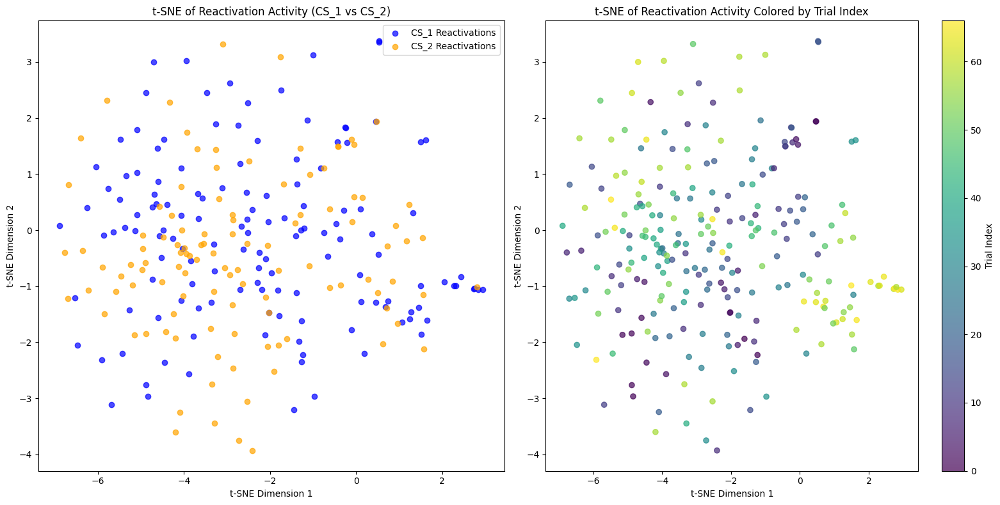

In [15]:
# Combine data for CS_1 and CS_2
combined_data = np.vstack([mean_activity_r_1, mean_activity_r_2])  # Shape: (total_reactivations, neurons)
combined_trial_indices = np.hstack([trial_r_1, trial_r_2])  # Combine trial indices
labels = np.array([0] * len(mean_activity_r_1) + [1] * len(mean_activity_r_2))  # 0 for CS_1, 1 for CS_2

# Standardize the data
scaler = StandardScaler()
standardized_data = scaler.fit_transform(combined_data)

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(standardized_data)  # Shape: (total_reactivations, 2)

# Plotting
plt.figure(figsize=(16, 8))

# Subplot 1: CS_1 vs CS_2 Reactivations
plt.subplot(1, 2, 1)
for label, color, name in zip([0, 1], ['blue', 'orange'], ['CS_1', 'CS_2']):
    plt.scatter(
        tsne_results[labels == label, 0],
        tsne_results[labels == label, 1],
        alpha=0.7,
        label=f'{name} Reactivations',
        color=color
    )
plt.title("t-SNE of Reactivation Activity (CS_1 vs CS_2)")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend()

# Subplot 2: Color by Trial Index
plt.subplot(1, 2, 2)
scatter = plt.scatter(
    tsne_results[:, 0],
    tsne_results[:, 1],
    c=combined_trial_indices,
    cmap='viridis',
    alpha=0.7
)
plt.colorbar(scatter, label="Trial Index")
plt.title("t-SNE of Reactivation Activity Colored by Trial Index")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")

plt.tight_layout()
plt.show()


In [16]:
print(mean_activity_cs_1.min(), mean_activity_cs_1.max())

0.0 7.020022880523038


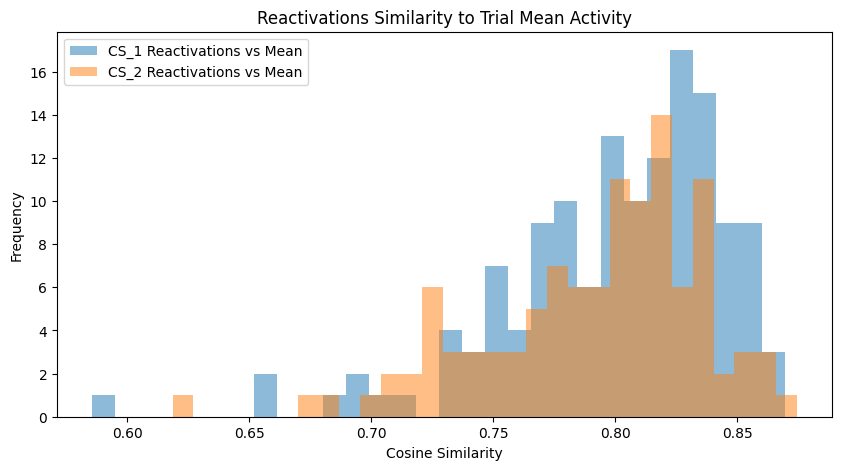

In [17]:
# Group reactivations by their trial indices for CS_1
reactivations_grouped_cs_1 = []
for trial_idx in range(len(mean_activity_cs_1)):
    # Select reactivations corresponding to this trial
    trial_reactivations = mean_activity_r_1[np.array(trial_r_1) == trial_idx, :]
    reactivations_grouped_cs_1.append(trial_reactivations)

# Group reactivations by their trial indices for CS_2
reactivations_grouped_cs_2 = []
for trial_idx in range(len(mean_activity_cs_2)):
    trial_reactivations = mean_activity_r_2[np.array(trial_r_2) == trial_idx, :]
    reactivations_grouped_cs_2.append(trial_reactivations)

# Compare reactivations to mean activity for CS_1
cs_1_similarities = []
for trial_idx in range(len(mean_activity_cs_1)):
    trial_mean = mean_activity_cs_1[trial_idx, :]  # Mean activity for the trial
    trial_reactivations = reactivations_grouped_cs_1[trial_idx]  # Reactivations in the trial
    
    if len(trial_reactivations) > 0:  # Ensure there are reactivations
        similarities = cosine_similarity(trial_reactivations, trial_mean.reshape(1, -1))
        cs_1_similarities.extend(similarities.flatten())

# Compare reactivations to mean activity for CS_2
cs_2_similarities = []
for trial_idx in range(len(mean_activity_cs_2)):
    trial_mean = mean_activity_cs_2[trial_idx, :]
    trial_reactivations = reactivations_grouped_cs_2[trial_idx]
    
    if len(trial_reactivations) > 0:
        similarities = cosine_similarity(trial_reactivations, trial_mean.reshape(1, -1))
        cs_2_similarities.extend(similarities.flatten())

# Visualize similarity distributions
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
plt.hist(cs_1_similarities, bins=30, alpha=0.5, label='CS_1 Reactivations vs Mean')
plt.hist(cs_2_similarities, bins=30, alpha=0.5, label='CS_2 Reactivations vs Mean')
plt.xlabel("Cosine Similarity")
plt.ylabel("Frequency")
plt.legend()
plt.title("Reactivations Similarity to Trial Mean Activity")
plt.show()



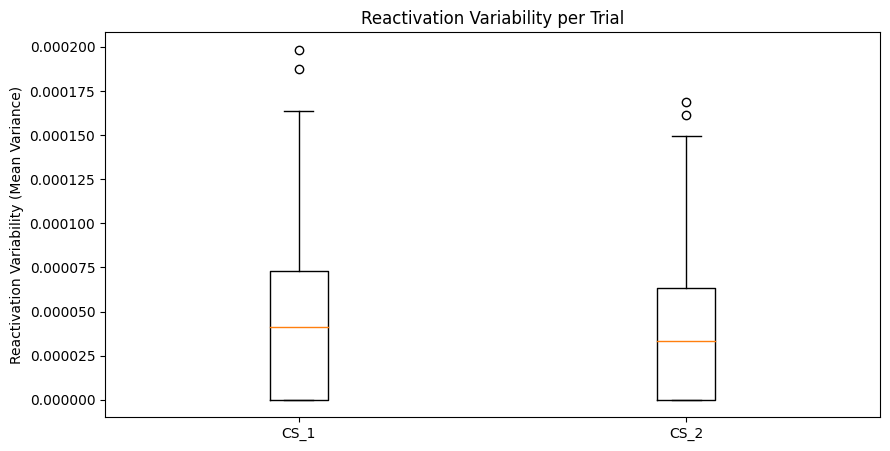

In [18]:
# Compute variability of reactivations within each trial for CS_1
cs_1_variability = []
for trial_reactivations in reactivations_grouped_cs_1:
    if len(trial_reactivations) > 0:
        variance = np.var(trial_reactivations, axis=0).mean()  # Mean variance across neurons
        cs_1_variability.append(variance)

# Compute variability of reactivations within each trial for CS_2
cs_2_variability = []
for trial_reactivations in reactivations_grouped_cs_2:
    if len(trial_reactivations) > 0:
        variance = np.var(trial_reactivations, axis=0).mean()
        cs_2_variability.append(variance)

# Visualize variability
plt.figure(figsize=(10, 5))
plt.boxplot([cs_1_variability, cs_2_variability], labels=['CS_1', 'CS_2'])
plt.ylabel("Reactivation Variability (Mean Variance)")
plt.title("Reactivation Variability per Trial")
plt.show()


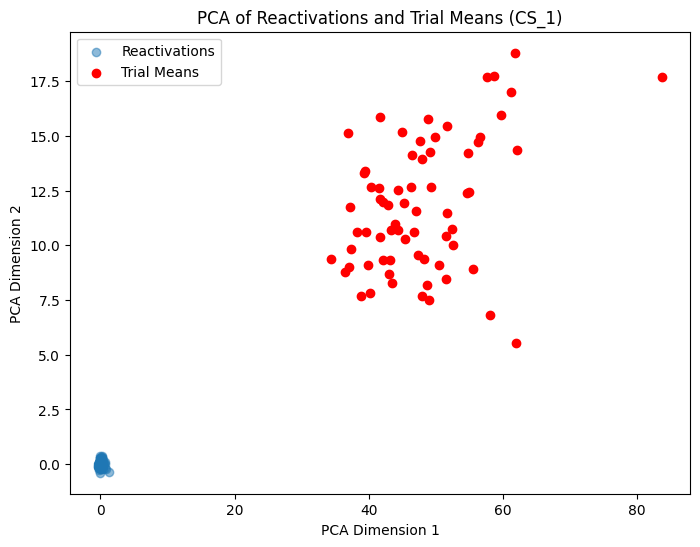

In [19]:

# Combine all reactivations for CS_1 and perform PCA
all_reactivations_cs_1 = np.vstack(mean_activity_r_1)
pca = PCA(n_components=2)
reactivation_pca1 = pca.fit_transform(all_reactivations_cs_1)

# Overlay trial means on PCA plot
trial_means_pca1 = pca.transform(mean_activity_cs_1)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(reactivation_pca1[:, 0], reactivation_pca1[:, 1], alpha=0.5, label='Reactivations')
plt.scatter(trial_means_pca1[:, 0], trial_means_pca1[:, 1], color='red', label='Trial Means')
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.legend()
plt.title("PCA of Reactivations and Trial Means (CS_1)")
plt.show()


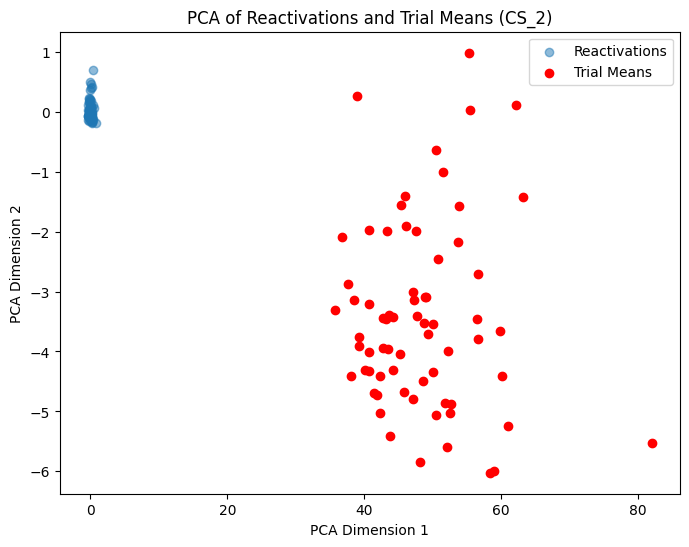

In [20]:
# Combine all reactivations for CS_1 and perform PCA
all_reactivations_cs_2 = np.vstack(mean_activity_r_2)
pca = PCA(n_components=2)
reactivation_pca2 = pca.fit_transform(all_reactivations_cs_2)

# Overlay trial means on PCA plot
trial_means_pca2 = pca.transform(mean_activity_cs_1)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(reactivation_pca2[:, 0], reactivation_pca2[:, 1], alpha=0.5, label='Reactivations')
plt.scatter(trial_means_pca2[:, 0], trial_means_pca2[:, 1], color='red', label='Trial Means')
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.legend()
plt.title("PCA of Reactivations and Trial Means (CS_2)")
plt.show()

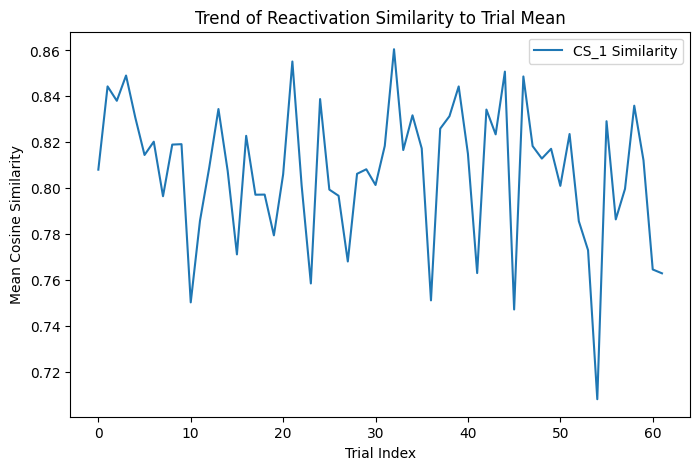

In [21]:
# Similarity trends over trials
trial_indices1 = np.array(trial_r_1)
cs_1_similarity_by_trial = []
for trial_idx in range(len(mean_activity_cs_1)):
    trial_similarities1 = [cs_1_similarities[i] for i in range(len(trial_indices1)) if trial_indices1[i] == trial_idx]
    if len(trial_similarities1) > 0:
        cs_1_similarity_by_trial.append(np.mean(trial_similarities1))

# Plot similarity trends
plt.figure(figsize=(8, 5))
plt.plot(cs_1_similarity_by_trial, label='CS_1 Similarity')
plt.xlabel("Trial Index")
plt.ylabel("Mean Cosine Similarity")
plt.title("Trend of Reactivation Similarity to Trial Mean")
plt.legend()
plt.show()


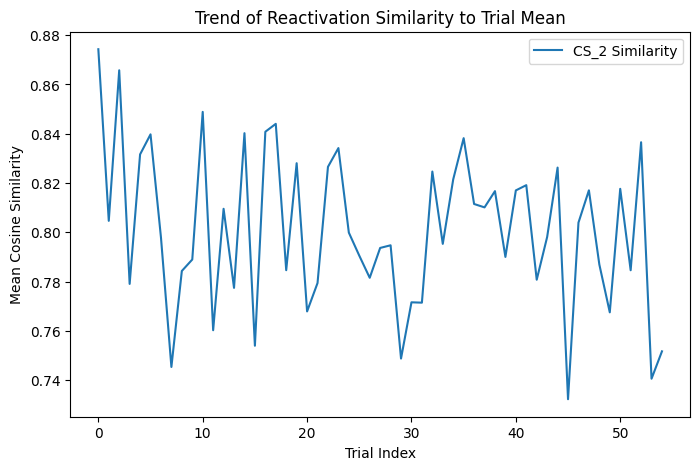

In [22]:
# Similarity trends over trials
trial_indices2 = np.array(trial_r_2)
cs_2_similarity_by_trial = []
for trial_idx in range(len(mean_activity_cs_2)):
    trial_similarities2 = [cs_2_similarities[i] for i in range(len(trial_indices2)) if trial_indices2[i] == trial_idx]
    if len(trial_similarities2) > 0:
        cs_2_similarity_by_trial.append(np.mean(trial_similarities2))

# Plot similarity trends
plt.figure(figsize=(8, 5))
plt.plot(cs_2_similarity_by_trial, label='CS_2 Similarity')
plt.xlabel("Trial Index")
plt.ylabel("Mean Cosine Similarity")
plt.title("Trend of Reactivation Similarity to Trial Mean")
plt.legend()
plt.show()


In [23]:
# Recalculate variance within clusters using the provided PCA data

# Variance for reactivations
reactivation_variance1 = np.var(reactivation_pca1, axis=0)  

# Variance for trial means
trial_mean_variance1 = np.var(trial_means_pca1, axis=0)      

# Total variance (sum of variances across PCA dimensions)
reactivation_total_variance1 = np.sum(reactivation_variance1)
trial_mean_total_variance1 = np.sum(trial_mean_variance1)

# Output the results
reactivation_variance1, trial_mean_variance1, reactivation_total_variance1, trial_mean_total_variance1


(array([0.05345272, 0.01890068]),
 array([69.45203569,  8.97789322]),
 0.07235339980716939,
 78.42992891005882)

In [24]:

# Variance for reactivations
reactivation_variance2 = np.var(reactivation_pca2, axis=0)  

# Variance for trial means
trial_mean_variance2 = np.var(trial_means_pca2, axis=0)      

# Total variance (sum of variances across PCA dimensions)
reactivation_total_variance2 = np.sum(reactivation_variance2)
trial_mean_total_variance2 = np.sum(trial_mean_variance2)

# Output the results
reactivation_variance2, trial_mean_variance2, reactivation_total_variance2, trial_mean_total_variance2


(array([0.03472387, 0.02068713]),
 array([62.29437614,  2.40988566]),
 0.055411000318082826,
 64.70426180155332)

     Reactivation Index  Trial Index  Similarity to Previous Trial  \
0                     0            1                      0.786246   
1                     1            1                      0.795943   
2                     2            1                      0.838692   
3                     3            2                      0.777374   
4                     4            2                      0.837013   
..                  ...          ...                           ...   
134                 134           65                      0.789430   
135                 135           66                      0.820310   
136                 136           66                      0.654708   
137                 137           66                      0.795590   
138                 138           66                      0.839732   

     Similarity to Current Trial  Similarity to Next Trial  
0                       0.788961                  0.814165  
1                       0.794914     

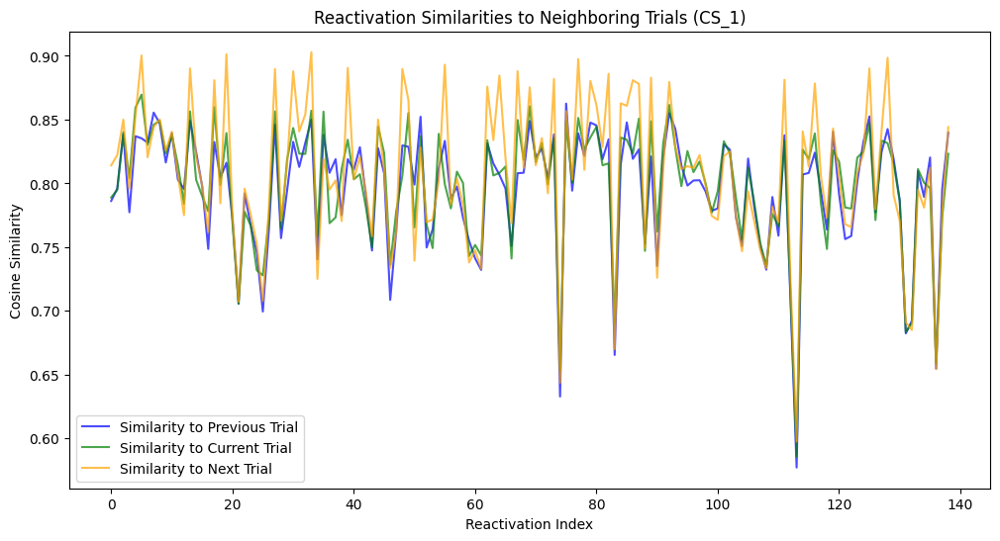

In [25]:
# Initialize lists to store similarity results
reactivation_to_trial_similarities = []

# Iterate through each reactivation
for r_idx, reactivation in enumerate(mean_activity_r_1):  # Reactivations for CS_1
    trial_idx = trial_r_1[r_idx]  # Get the trial index associated with the reactivation
    
    # Find the neighboring trials (e.g., the current, previous, and next trial means)
    previous_trial_mean = mean_activity_cs_1[trial_idx - 1] if trial_idx > 0 else None
    current_trial_mean = mean_activity_cs_1[trial_idx]
    next_trial_mean = mean_activity_cs_1[trial_idx + 1] if trial_idx < len(mean_activity_cs_1) - 1 else None

    # Calculate cosine similarity for each case
    similarities = {
        "Reactivation Index": r_idx,
        "Trial Index": trial_idx,
        "Similarity to Previous Trial": cosine_similarity(
            reactivation.reshape(1, -1), previous_trial_mean.reshape(1, -1)
        )[0, 0] if previous_trial_mean is not None else np.nan,
        "Similarity to Current Trial": cosine_similarity(
            reactivation.reshape(1, -1), current_trial_mean.reshape(1, -1)
        )[0, 0],
        "Similarity to Next Trial": cosine_similarity(
            reactivation.reshape(1, -1), next_trial_mean.reshape(1, -1)
        )[0, 0] if next_trial_mean is not None else np.nan,
    }
    
    # Append the similarity results for this reactivation
    reactivation_to_trial_similarities.append(similarities)

similarities_df = pd.DataFrame(reactivation_to_trial_similarities)

# Display the similarity results
print(similarities_df)

plt.figure(figsize=(12, 6))

# Plot similarities to each trial type
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Previous Trial"],
    label="Similarity to Previous Trial", color="blue", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Current Trial"],
    label="Similarity to Current Trial", color="green", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Next Trial"],
    label="Similarity to Next Trial", color="orange", alpha=0.7
)

# Add labels and legend
plt.xlabel("Reactivation Index")
plt.ylabel("Cosine Similarity")
plt.title("Reactivation Similarities to Neighboring Trials (CS_1)")
plt.legend()
plt.show()


<bound method NDFrame.head of      Reactivation Index  Trial Index  Similarity to Previous Trial  \
0                     0            0                           NaN   
1                     1            1                      0.782825   
2                     2            1                      0.816888   
3                     3            1                      0.818244   
4                     4            2                      0.858233   
..                  ...          ...                           ...   
106                 106           57                      0.818693   
107                 107           58                      0.764068   
108                 108           58                      0.721676   
109                 109           58                      0.743129   
110                 110           58                      0.809340   

     Similarity to Current Trial  Similarity to Next Trial  
0                       0.874293                  0.887766  
1      

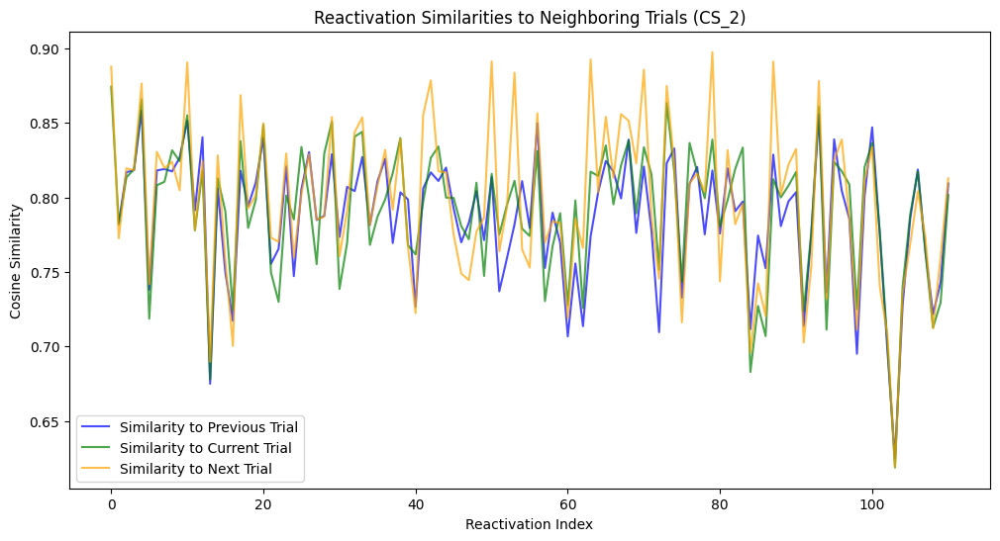

In [26]:
# Initialize lists to store similarity results
reactivation_to_trial_similarities = []

# Iterate through each reactivation
for r_idx, reactivation in enumerate(mean_activity_r_2):  # Reactivations for CS_1
    trial_idx = trial_r_2[r_idx]  # Get the trial index associated with the reactivation
    
    # Find the neighboring trials (e.g., the current, previous, and next trial means)
    previous_trial_mean = mean_activity_cs_2[trial_idx - 1] if trial_idx > 0 else None
    current_trial_mean = mean_activity_cs_2[trial_idx]
    next_trial_mean = mean_activity_cs_2[trial_idx + 1] if trial_idx < len(mean_activity_cs_2) - 1 else None

    # Calculate cosine similarity for each case
    similarities = {
        "Reactivation Index": r_idx,
        "Trial Index": trial_idx,
        "Similarity to Previous Trial": cosine_similarity(
            reactivation.reshape(1, -1), previous_trial_mean.reshape(1, -1)
        )[0, 0] if previous_trial_mean is not None else np.nan,
        "Similarity to Current Trial": cosine_similarity(
            reactivation.reshape(1, -1), current_trial_mean.reshape(1, -1)
        )[0, 0],
        "Similarity to Next Trial": cosine_similarity(
            reactivation.reshape(1, -1), next_trial_mean.reshape(1, -1)
        )[0, 0] if next_trial_mean is not None else np.nan,
    }
    
    # Append the similarity results for this reactivation
    reactivation_to_trial_similarities.append(similarities)

similarities_df = pd.DataFrame(reactivation_to_trial_similarities)

# Display the similarity results
print(similarities_df.head)
print(len(mean_activity_r_2))

plt.figure(figsize=(12, 6))

# Plot similarities to each trial type
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Previous Trial"],
    label="Similarity to Previous Trial", color="blue", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Current Trial"],
    label="Similarity to Current Trial", color="green", alpha=0.7
)
plt.plot(
    similarities_df["Reactivation Index"], similarities_df["Similarity to Next Trial"],
    label="Similarity to Next Trial", color="orange", alpha=0.7
)

# Add labels and legend
plt.xlabel("Reactivation Index")
plt.ylabel("Cosine Similarity")
plt.title("Reactivation Similarities to Neighboring Trials (CS_2)")
plt.legend()
plt.show()


In [27]:
# Select top 10% and bottom 10% activations
def get_top_bottom_indices(activity, top_percent=0.05, bottom_percent=0.05):
    num_neurons = activity.shape[1]
    top_n = int(num_neurons * top_percent)
    bottom_n = int(num_neurons * bottom_percent)
    
    top_indices = np.argsort(activity, axis=1)[:, -top_n:]
    bottom_indices = np.argsort(activity, axis=1)[:, :bottom_n]
    
    return top_indices, bottom_indices

# Compute similarity for subsets of neurons
def compute_subset_similarities(mean_activity_r, trial_r, mean_activity_cs, onsets_cs, subset_indices):
    similarities = []

    for r_idx, trial_idx in enumerate(trial_r):
        # Get reactivation activity for the subset
        reactivation_activity = mean_activity_r[r_idx, subset_indices[r_idx]]
        
        # Get mean activity for the previous, current, and next trials
        prev_trial = trial_idx - 1 if trial_idx > 0 else None
        next_trial = trial_idx + 1 if trial_idx < len(mean_activity_cs) - 1 else None
        
        prev_similarity = (
            cosine_similarity(
                reactivation_activity.reshape(1, -1),
                mean_activity_cs[prev_trial, subset_indices[r_idx]].reshape(1, -1),
            )[0, 0]
            if prev_trial is not None
            else np.nan
        )
        
        current_similarity = cosine_similarity(
            reactivation_activity.reshape(1, -1),
            mean_activity_cs[trial_idx, subset_indices[r_idx]].reshape(1, -1),
        )[0, 0]
        
        next_similarity = (
            cosine_similarity(
                reactivation_activity.reshape(1, -1),
                mean_activity_cs[next_trial, subset_indices[r_idx]].reshape(1, -1),
            )[0, 0]
            if next_trial is not None
            else np.nan
        )
        
        similarities.append(
            [r_idx, trial_idx, prev_similarity, current_similarity, next_similarity]
        )
    
    return pd.DataFrame(
        similarities,
        columns=[
            "Reactivation Index",
            "Trial Index",
            "Similarity to Previous Trial",
            "Similarity to Current Trial",
            "Similarity to Next Trial",
        ],
    )

# Top 10% and bottom 10% activations for reactivations
top_indices_r, bottom_indices_r = get_top_bottom_indices(mean_activity_r_1)
top_indices_cs, bottom_indices_cs = get_top_bottom_indices(mean_activity_cs_1)

# Compute similarities for top 10% and bottom 10%
similarities_top_10 = compute_subset_similarities(
    mean_activity_r_1, trial_r_1, mean_activity_cs_1, onsets_cs_1, top_indices_r
)
similarities_bottom_10 = compute_subset_similarities(
    mean_activity_r_1, trial_r_1, mean_activity_cs_1, onsets_cs_1, bottom_indices_r
)


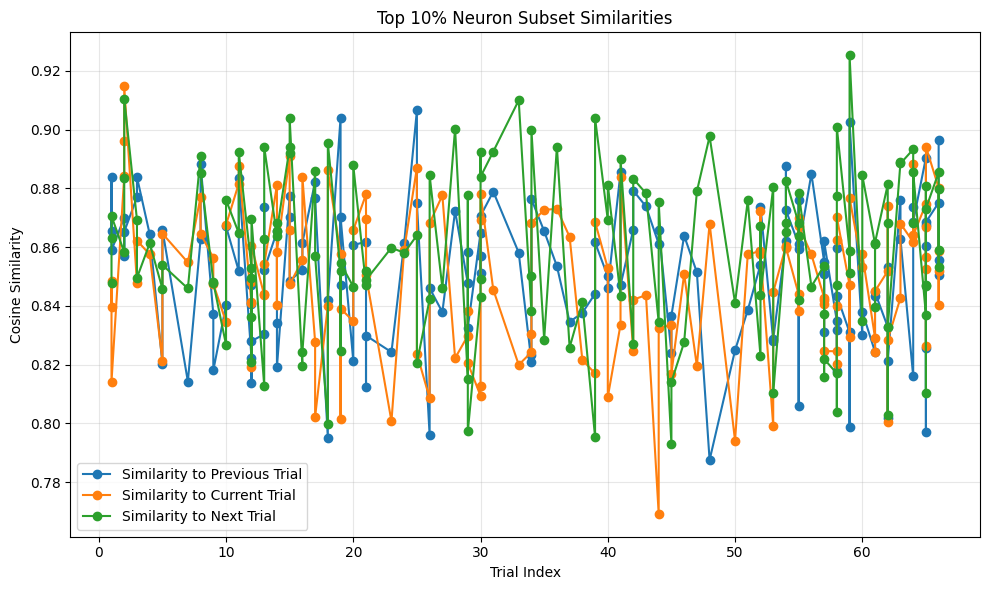

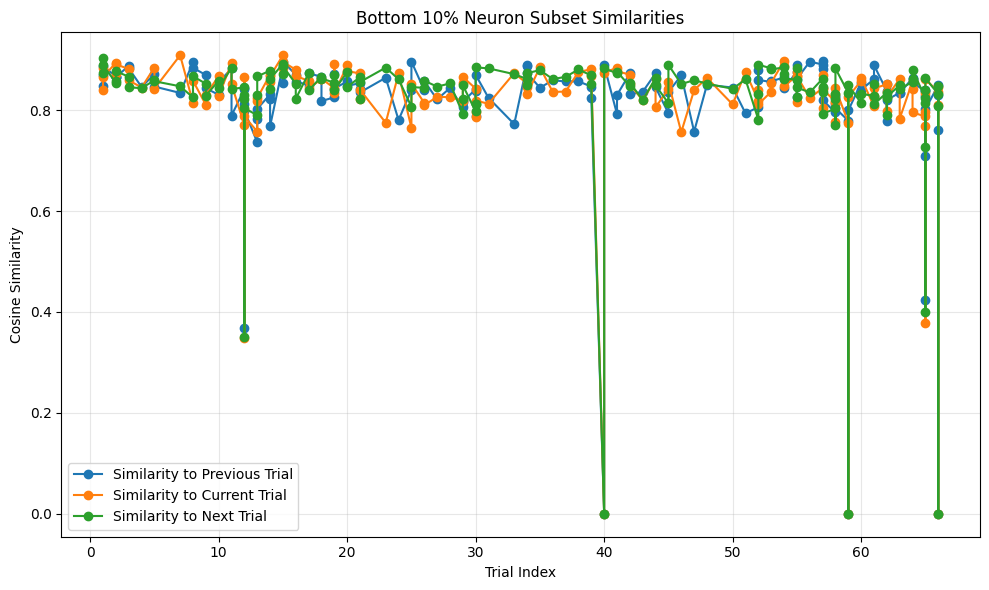

In [28]:

def plot_similarity_results(similarities, title):
    plt.figure(figsize=(10, 6))

    # Plot similarities
    plt.plot(
        similarities["Trial Index"],
        similarities["Similarity to Previous Trial"],
        label="Similarity to Previous Trial",
        marker="o",
        linestyle="-",
    )
    plt.plot(
        similarities["Trial Index"],
        similarities["Similarity to Current Trial"],
        label="Similarity to Current Trial",
        marker="o",
        linestyle="-",
    )
    plt.plot(
        similarities["Trial Index"],
        similarities["Similarity to Next Trial"],
        label="Similarity to Next Trial",
        marker="o",
        linestyle="-",
    )

    # Customize plot
    plt.title(title)
    plt.xlabel("Trial Index")
    plt.ylabel("Cosine Similarity")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Plot results for top 10% neurons
plot_similarity_results(similarities_top_10, "Top 10% Neuron Subset Similarities")

# Plot results for bottom 10% neurons
plot_similarity_results(similarities_bottom_10, "Bottom 10% Neuron Subset Similarities")


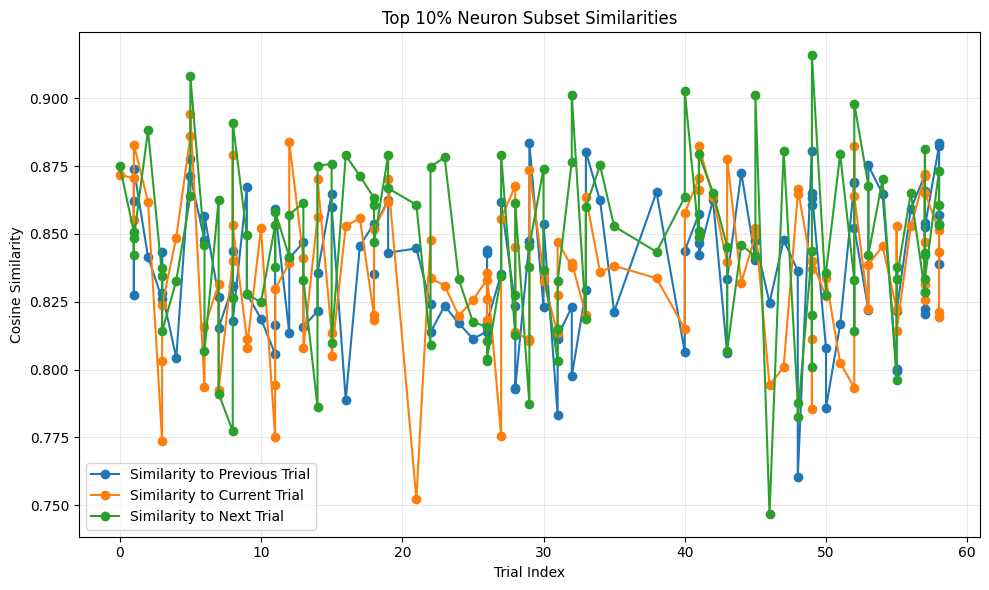

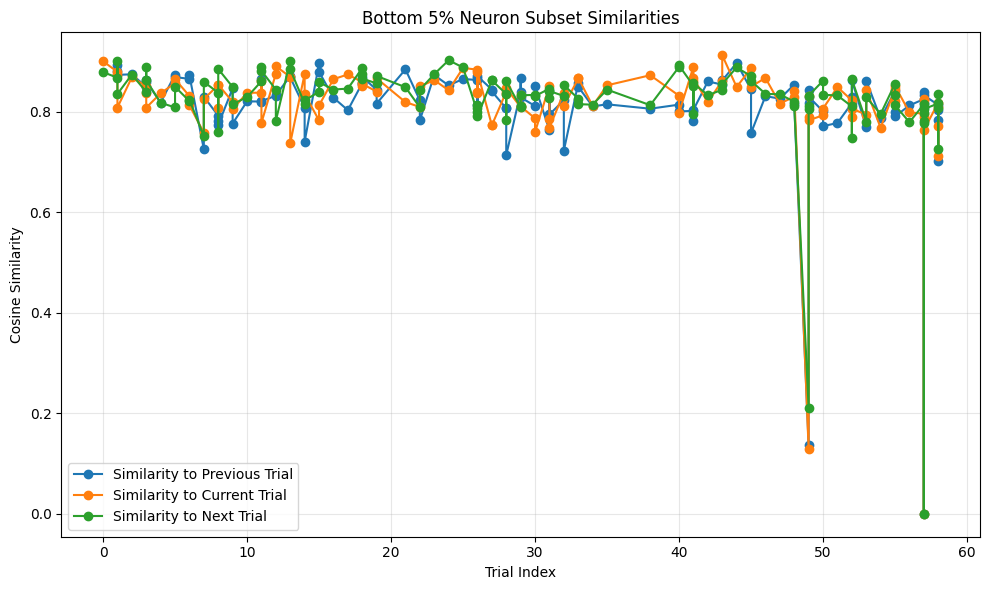

In [29]:
top_indices_r, bottom_indices_r = get_top_bottom_indices(mean_activity_r_2)
top_indices_cs, bottom_indices_cs = get_top_bottom_indices(mean_activity_cs_2)

# Compute similarities for top 10% and bottom 10%
similarities_top_10 = compute_subset_similarities(
    mean_activity_r_2, trial_r_2, mean_activity_cs_2, onsets_cs_2, top_indices_r
)
similarities_bottom_10 = compute_subset_similarities(
    mean_activity_r_2, trial_r_2, mean_activity_cs_2, onsets_cs_2, bottom_indices_r
)

plot_similarity_results(similarities_top_10, "Top 10% Neuron Subset Similarities")

# Plot histograms for bottom 10% neurons
plot_similarity_results(similarities_bottom_10, "Bottom 5% Neuron Subset Similarities")

In [30]:
def top_10_percent_indices(activity):
    """
    Get the indices of the top 10% most active neurons.
    :param activity: Array of mean activity (trials x neurons or reactivations x neurons)
    :return: Set of indices of the top 10% neurons
    """
    mean_activity = activity.mean(axis=0)  # Average across trials/reactivations
    threshold = np.percentile(mean_activity, 95)  # Top 10% threshold
    top_indices = np.where(mean_activity >= threshold)[0]  # Indices of top 10%
    return set(top_indices)


# Compute top 10% neuron indices
top_cs_1_indices = top_10_percent_indices(mean_activity_cs_1)
top_cs_2_indices = top_10_percent_indices(mean_activity_cs_2)
top_r_1_indices = top_10_percent_indices(mean_activity_r_1)
top_r_2_indices = top_10_percent_indices(mean_activity_r_2)

# Compare overlaps
def compute_overlap(set1, set2):
    """
    Compute overlap between two sets of indices.
    :param set1: Set of indices
    :param set2: Set of indices
    :return: Fractional overlap (intersection size / union size)
    """
    intersection = set1 & set2
    union = set1 | set2
    return len(intersection), len(union), len(intersection) / len(union)  # Overlap, total size, Jaccard index


# Compare and print overlaps
overlap_cs1_r1 = compute_overlap(top_cs_1_indices, top_r_1_indices)
overlap_cs2_r2 = compute_overlap(top_cs_2_indices, top_r_2_indices)
overlap_cs1_cs2 = compute_overlap(top_cs_1_indices, top_cs_2_indices)
overlap_r1_r2 = compute_overlap(top_r_1_indices, top_r_2_indices)
overlap_cs1_r2 = compute_overlap(top_cs_1_indices, top_r_2_indices)
overlap_cs2_r1 = compute_overlap(top_cs_2_indices, top_r_1_indices)

print(f"Overlap between CS_1 and R_1: {overlap_cs1_r1[0]} / {overlap_cs1_r1[1]} (Jaccard: {overlap_cs1_r1[2]:.2f})")
print(f"Overlap between CS_2 and R_2: {overlap_cs2_r2[0]} / {overlap_cs2_r2[1]} (Jaccard: {overlap_cs2_r2[2]:.2f})")
print(f"Overlap between CS_1 and CS_2: {overlap_cs1_cs2[0]} / {overlap_cs1_cs2[1]} (Jaccard: {overlap_cs1_cs2[2]:.2f})")
print(f"Overlap between R_1 and R_2: {overlap_r1_r2[0]} / {overlap_r1_r2[1]} (Jaccard: {overlap_r1_r2[2]:.2f})")
print(f"Overlap between CS_1 and R_2: {overlap_cs1_r2[0]} / {overlap_cs1_r2[1]} (Jaccard: {overlap_cs1_r2[2]:.2f})")
print(f"Overlap between CS_2 and R_1: {overlap_cs2_r1[0]} / {overlap_cs2_r1[1]} (Jaccard: {overlap_cs2_r1[2]:.2f})")

#print(top_cs_1_indices)



Overlap between CS_1 and R_1: 7 / 307 (Jaccard: 0.02)
Overlap between CS_2 and R_2: 10 / 304 (Jaccard: 0.03)
Overlap between CS_1 and CS_2: 0 / 314 (Jaccard: 0.00)
Overlap between R_1 and R_2: 121 / 193 (Jaccard: 0.63)
Overlap between CS_1 and R_2: 5 / 309 (Jaccard: 0.02)
Overlap between CS_2 and R_1: 8 / 306 (Jaccard: 0.03)


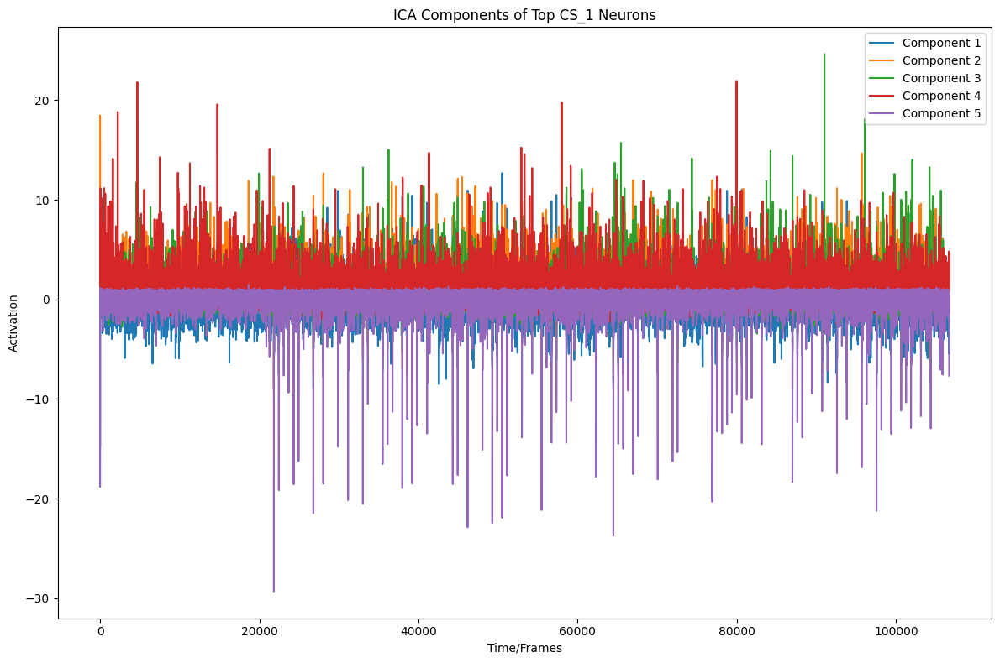

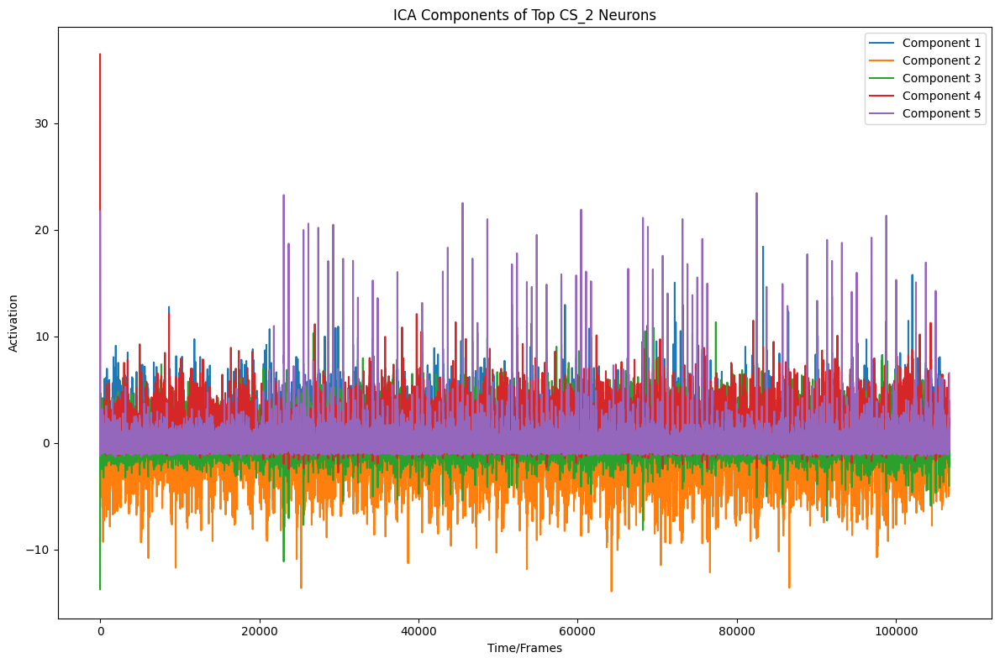

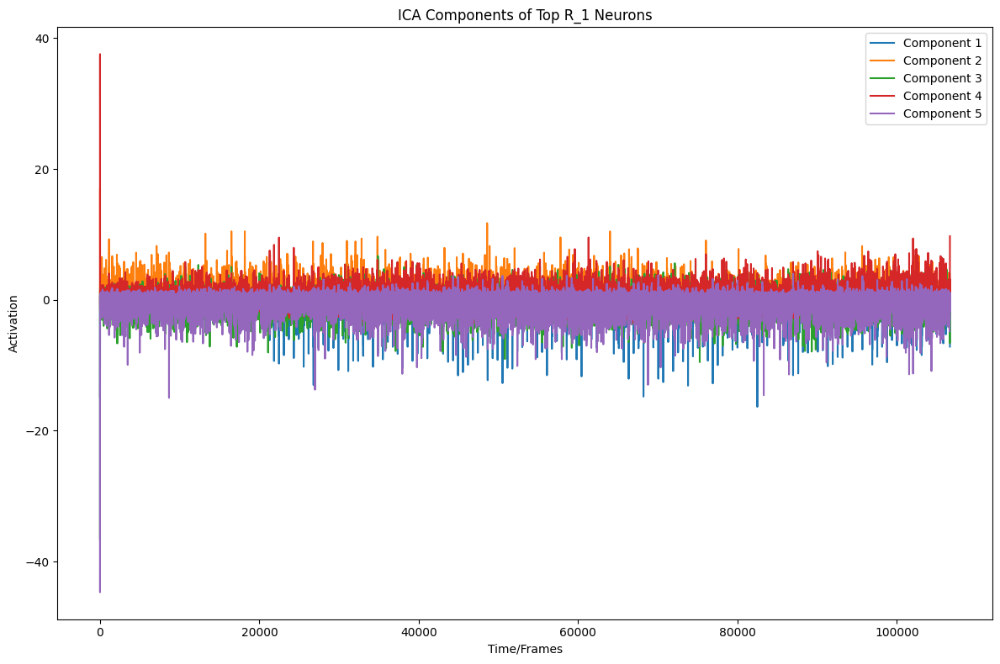

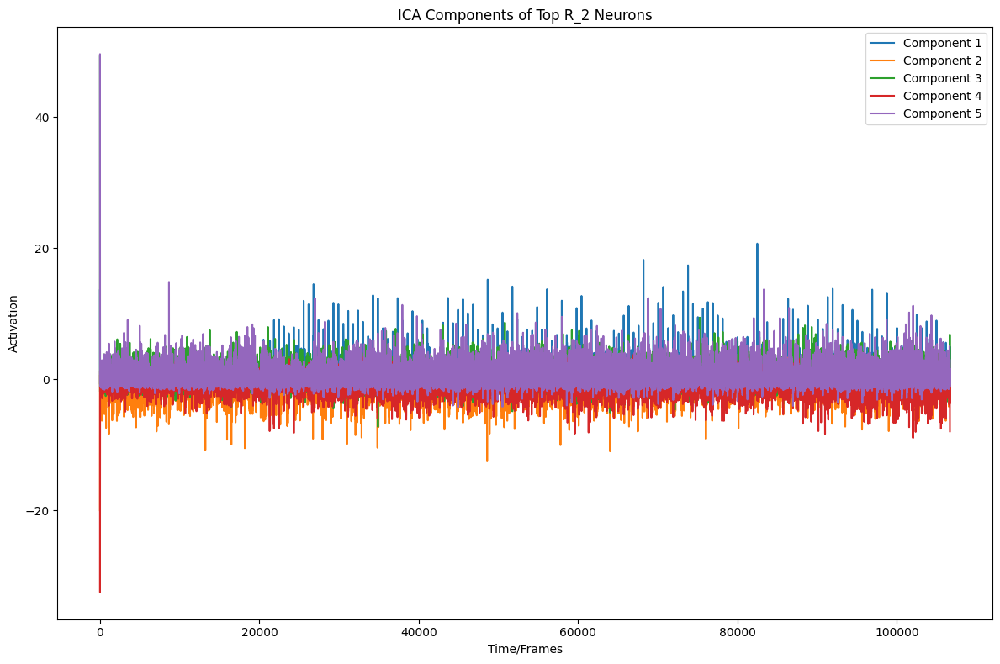

In [31]:
from sklearn.decomposition import FastICA
import matplotlib.pyplot as plt

# Function to perform ICA
def perform_ica(activity, n_components=10):
    """
    Perform ICA on the given activity matrix.
    :param activity: Array of shape (neurons, time/frames).
    :param n_components: Number of independent components to extract.
    :return: Independent components (neurons x components).
    """
    ica = FastICA(n_components=n_components, random_state=42)
    components = ica.fit_transform(activity.T)  # Transpose to shape (frames, neurons)
    return components.T  # Return shape as (components, frames)

# Extract activity matrices for top neurons
cs_1_activity_ica = activity[list(top_cs_1_indices), :]  # Top 10% neurons for CS_1
cs_2_activity_ica = activity[list(top_cs_2_indices), :]  # Top 10% neurons for CS_2
r_1_activity_ica = activity[list(top_r_1_indices), :]  # Top neurons for R_1
r_2_activity_ica = activity[list(top_r_2_indices), :]  # Top neurons for R_2

# Perform ICA
n_components = 5  # Number of components to extract
cs_1_components = perform_ica(cs_1_activity_ica, n_components=n_components)
cs_2_components = perform_ica(cs_2_activity_ica, n_components=n_components)
r_1_components = perform_ica(r_1_activity_ica, n_components=n_components)
r_2_components = perform_ica(r_2_activity_ica, n_components=n_components)

# Plot ICA components
def plot_ica_components(components, title):
    """
    Plot ICA components as time series.
    :param components: Array of shape (components, time/frames).
    :param title: Title for the plot.
    """
    plt.figure(figsize=(12, 8))
    for i, component in enumerate(components):
        plt.plot(component, label=f"Component {i+1}")
    plt.title(title)
    plt.xlabel("Time/Frames")
    plt.ylabel("Activation")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot for each condition
plot_ica_components(cs_1_components, "ICA Components of Top CS_1 Neurons")
plot_ica_components(cs_2_components, "ICA Components of Top CS_2 Neurons")
plot_ica_components(r_1_components, "ICA Components of Top R_1 Neurons")
plot_ica_components(r_2_components, "ICA Components of Top R_2 Neurons")


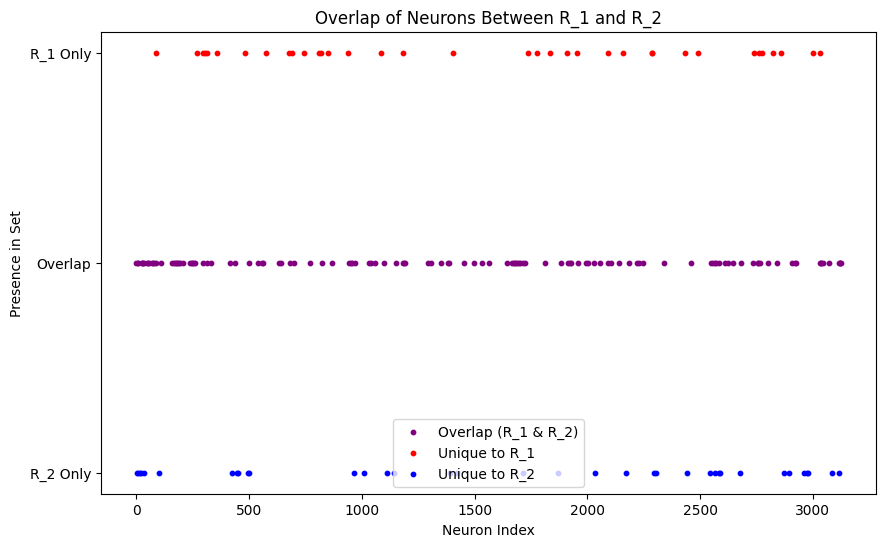

In [32]:
# Identify overlapping and unique neurons
overlap_neurons = top_r_1_indices & top_r_2_indices
unique_r1 = top_r_1_indices - top_r_2_indices
unique_r2 = top_r_2_indices - top_r_1_indices

# Prepare scatter plot data
overlap_indices = list(overlap_neurons)
unique_r1_indices = list(unique_r1)
unique_r2_indices = list(unique_r2)

# Plot the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(overlap_indices, [1] * len(overlap_indices), color='purple', label='Overlap (R_1 & R_2)', s=10)
plt.scatter(unique_r1_indices, [2] * len(unique_r1_indices), color='red', label='Unique to R_1', s=10)
plt.scatter(unique_r2_indices, [0] * len(unique_r2_indices), color='blue', label='Unique to R_2', s=10)

plt.yticks([0, 1, 2], ['R_2 Only', 'Overlap', 'R_1 Only'])
plt.xlabel("Neuron Index")
plt.ylabel("Presence in Set")
plt.title("Overlap of Neurons Between R_1 and R_2")
plt.legend()
plt.show()


Mean Overlap (R1 vs CS1): 0.06
Mean Overlap (R1 vs CS2): 0.06
Mean Overlap (R2 vs CS1): 0.06
Mean Overlap (R2 vs CS2): 0.06
Mean Overlap (R1 vs R2): 0.11
Mean Overlap (CS1 vs CS2): 0.03


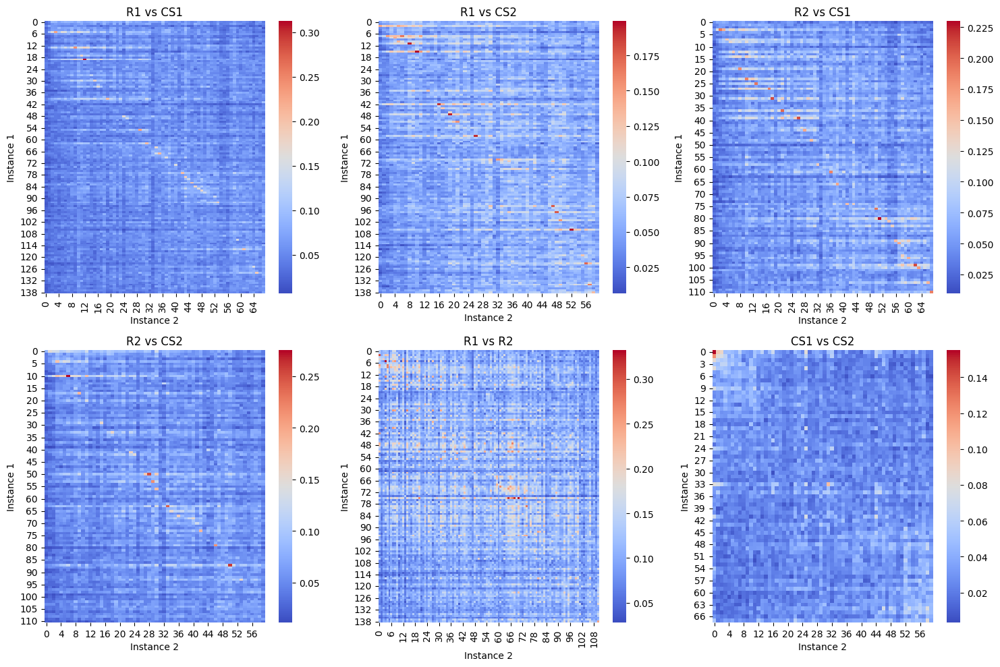

In [33]:
def top_10_percent_indices_per_instance(activity):
    """
    Get the indices of the top 10% most active neurons for each reactivation/trial.
    :param activity: Array of activity (reactivations/trials x neurons)
    :return: List of sets of top 10% indices for each reactivation/trial
    """
    top_indices_list = []
    for i in range(activity.shape[0]):
        threshold = np.percentile(activity[i],90)  # Top 10% threshold
        top_indices = np.where(activity[i] >= threshold)[0]
        top_indices_list.append(set(top_indices))
    return top_indices_list


def compute_overlap_across_conditions(top_indices_1, top_indices_2):
    """
    Compute overlap across two lists of top neuron indices.
    :param top_indices_1: List of sets (e.g., top neurons for r1 reactivations)
    :param top_indices_2: List of sets (e.g., top neurons for cs1 trials)
    :return: List of overlaps for each pair of reactivation/trial
    """
    overlaps = []
    for set_1 in top_indices_1:
        row_overlap = []
        for set_2 in top_indices_2:
            overlap = len(set_1 & set_2) / len(set_1 | set_2)  # Jaccard index
            row_overlap.append(overlap)
        overlaps.append(row_overlap)
    return np.array(overlaps)


# Get top 10% neuron indices for each instance
top_r1_indices_inst = top_10_percent_indices_per_instance(mean_activity_r_1)  # Reactivations for R1
top_r2_indices_inst = top_10_percent_indices_per_instance(mean_activity_r_2)  # Reactivations for R2
top_cs1_indices_inst = top_10_percent_indices_per_instance(mean_activity_cs_1)  # Trials for CS1
top_cs2_indices_inst = top_10_percent_indices_per_instance(mean_activity_cs_2)  # Trials for CS2

# Compute overlaps for each condition
overlap_r1_cs1_inst = compute_overlap_across_conditions(top_r1_indices_inst, top_cs1_indices_inst)
overlap_r1_cs2_inst = compute_overlap_across_conditions(top_r1_indices_inst, top_cs2_indices_inst)
overlap_r2_cs1_inst = compute_overlap_across_conditions(top_r2_indices_inst, top_cs1_indices_inst)
overlap_r2_cs2_inst = compute_overlap_across_conditions(top_r2_indices_inst, top_cs2_indices_inst)
overlap_r1_r2_inst = compute_overlap_across_conditions(top_r1_indices_inst, top_r2_indices_inst)
overlap_cs1_cs2_inst = compute_overlap_across_conditions(top_cs1_indices_inst, top_cs2_indices_inst)

# Compute mean overlaps for each condition
mean_overlap_r1_cs1_inst = np.mean(overlap_r1_cs1_inst)
mean_overlap_r1_cs2_inst = np.mean(overlap_r1_cs2_inst)
mean_overlap_r2_cs1_inst = np.mean(overlap_r2_cs1_inst)
mean_overlap_r2_cs2_inst = np.mean(overlap_r2_cs2_inst)
mean_overlap_r1_r2_inst = np.mean(overlap_r1_r2_inst)
mean_overlap_cs1_cs2_inst = np.mean(overlap_cs1_cs2_inst)

# Print mean overlaps
print(f"Mean Overlap (R1 vs CS1): {mean_overlap_r1_cs1_inst:.2f}")
print(f"Mean Overlap (R1 vs CS2): {mean_overlap_r1_cs2_inst:.2f}")
print(f"Mean Overlap (R2 vs CS1): {mean_overlap_r2_cs1_inst:.2f}")
print(f"Mean Overlap (R2 vs CS2): {mean_overlap_r2_cs2_inst:.2f}")
print(f"Mean Overlap (R1 vs R2): {mean_overlap_r1_r2_inst:.2f}")
print(f"Mean Overlap (CS1 vs CS2): {mean_overlap_cs1_cs2_inst:.2f}")

# Plot heatmaps
plt.figure(figsize=(15, 10))

conditions = [
    ("R1 vs CS1", overlap_r1_cs1_inst),
    ("R1 vs CS2", overlap_r1_cs2_inst),
    ("R2 vs CS1", overlap_r2_cs1_inst),
    ("R2 vs CS2", overlap_r2_cs2_inst),
    ("R1 vs R2", overlap_r1_r2_inst),
    ("CS1 vs CS2", overlap_cs1_cs2_inst),
]

for i, (title, overlap_matrix) in enumerate(conditions, 1):
    plt.subplot(2, 3, i)
    sns.heatmap(overlap_matrix, cmap="coolwarm", cbar=True)
    plt.title(title)
    plt.xlabel("Instance 2")
    plt.ylabel("Instance 1")

plt.tight_layout()
plt.show()

#how many of  top 10% active in trial/reactivation x are also in the top 10% or trial/reactivation y


In [34]:
import os
print(os.getcwd())
1

/home/lbeumer/reactivation/Reactivation/normal


1

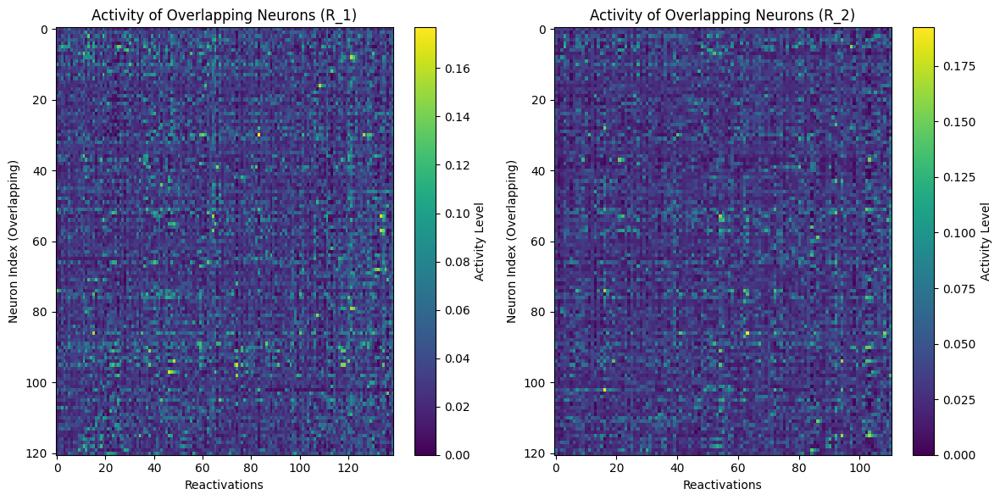

In [35]:
# Identify overlapping neurons
overlap_neurons = list(top_r_1_indices & top_r_2_indices)  # Convert to a list for indexing

# Extract activity of overlapping neurons from `mean_activity_r_1` and `mean_activity_r_2`
overlap_activity_r_1 = mean_activity_r_1[:, overlap_neurons]  # Reactivations x Overlapping Neurons
overlap_activity_r_2 = mean_activity_r_2[:, overlap_neurons]

# Plot activity for overlapping neurons
plt.figure(figsize=(12, 6))

# Heatmap for R_1
plt.subplot(1, 2, 1)
plt.imshow(overlap_activity_r_1.T, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Activity Level')
plt.title("Activity of Overlapping Neurons (R_1)")
plt.xlabel("Reactivations")
plt.ylabel("Neuron Index (Overlapping)")

# Heatmap for R_2
plt.subplot(1, 2, 2)
plt.imshow(overlap_activity_r_2.T, aspect='auto', cmap='viridis', interpolation='nearest')
plt.colorbar(label='Activity Level')
plt.title("Activity of Overlapping Neurons (R_2)")
plt.xlabel("Reactivations")
plt.ylabel("Neuron Index (Overlapping)")

plt.tight_layout()
plt.show()


# analyzing overlapping 5% reactivation neurons

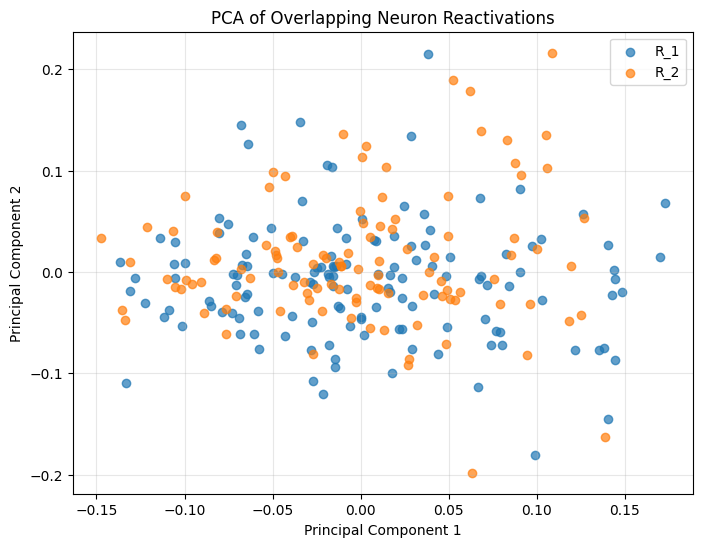

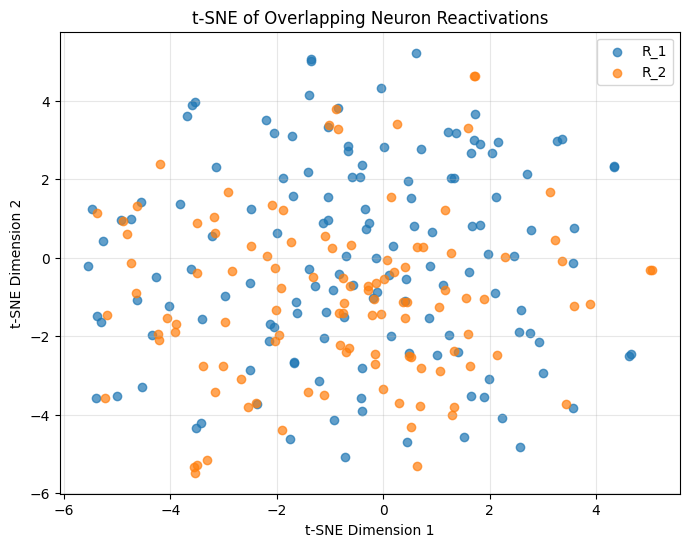

In [36]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Combine overlapping activity from R_1 and R_2
combined_overlap_activity = np.vstack([overlap_activity_r_1, overlap_activity_r_2])

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(combined_overlap_activity)

# Plot PCA results
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:overlap_activity_r_1.shape[0], 0], 
            pca_result[:overlap_activity_r_1.shape[0], 1], label="R_1", alpha=0.7)
plt.scatter(pca_result[overlap_activity_r_1.shape[0]:, 0], 
            pca_result[overlap_activity_r_1.shape[0]:, 1], label="R_2", alpha=0.7)
plt.title("PCA of Overlapping Neuron Reactivations")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Apply t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_result = tsne.fit_transform(combined_overlap_activity)

# Plot t-SNE results
plt.figure(figsize=(8, 6))
plt.scatter(tsne_result[:overlap_activity_r_1.shape[0], 0], 
            tsne_result[:overlap_activity_r_1.shape[0], 1], label="R_1", alpha=0.7)
plt.scatter(tsne_result[overlap_activity_r_1.shape[0]:, 0], 
            tsne_result[overlap_activity_r_1.shape[0]:, 1], label="R_2", alpha=0.7)
plt.title("t-SNE of Overlapping Neuron Reactivations")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


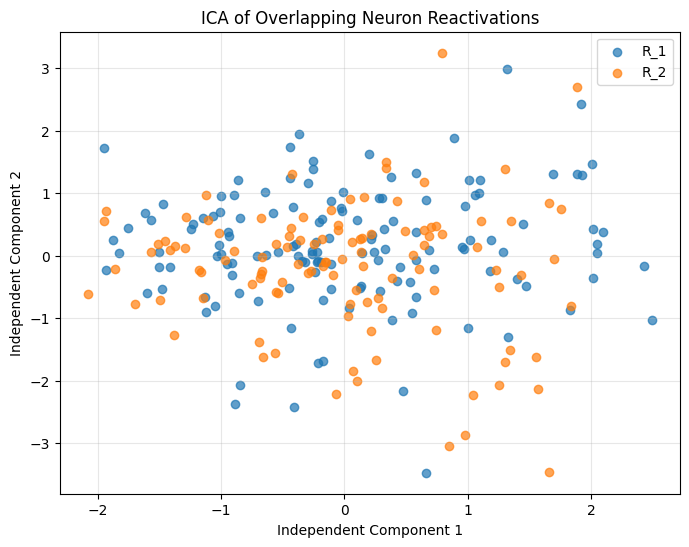

In [37]:
from sklearn.decomposition import FastICA

# Apply ICA
ica = FastICA(n_components=2, random_state=42)
ica_result = ica.fit_transform(combined_overlap_activity)

# Plot ICA results
plt.figure(figsize=(8, 6))
plt.scatter(ica_result[:overlap_activity_r_1.shape[0], 0], 
            ica_result[:overlap_activity_r_1.shape[0], 1], label="R_1", alpha=0.7)
plt.scatter(ica_result[overlap_activity_r_1.shape[0]:, 0], 
            ica_result[overlap_activity_r_1.shape[0]:, 1], label="R_2", alpha=0.7)
plt.title("ICA of Overlapping Neuron Reactivations")
plt.xlabel("Independent Component 1")
plt.ylabel("Independent Component 2")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


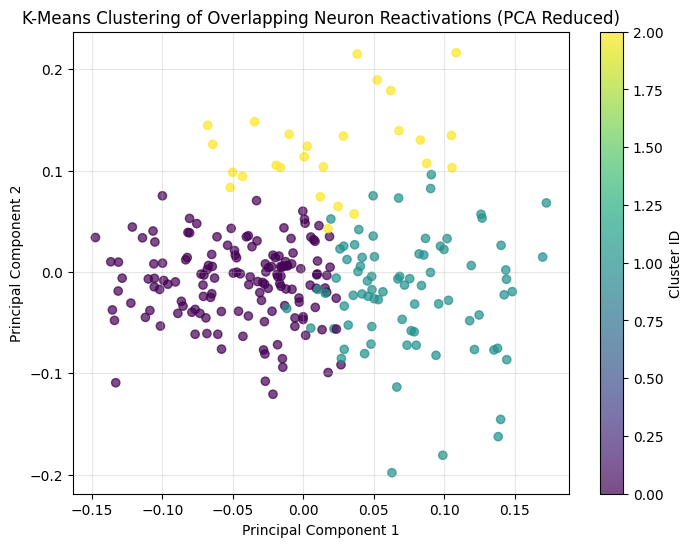

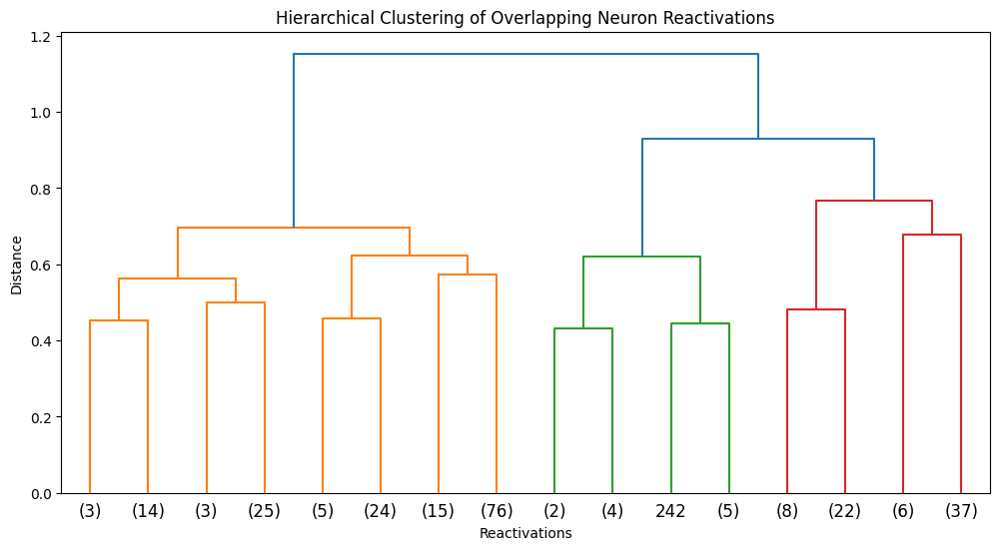

In [38]:
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage

# Apply K-Means
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(combined_overlap_activity)

# Plot clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=clusters, cmap="viridis", alpha=0.7)
plt.title("K-Means Clustering of Overlapping Neuron Reactivations (PCA Reduced)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(label="Cluster ID")
plt.grid(alpha=0.3)
plt.show()

# Apply Hierarchical Clustering
linkage_matrix = linkage(combined_overlap_activity, method='ward')
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=3)
plt.title("Hierarchical Clustering of Overlapping Neuron Reactivations")
plt.xlabel("Reactivations")
plt.ylabel("Distance")
plt.show()


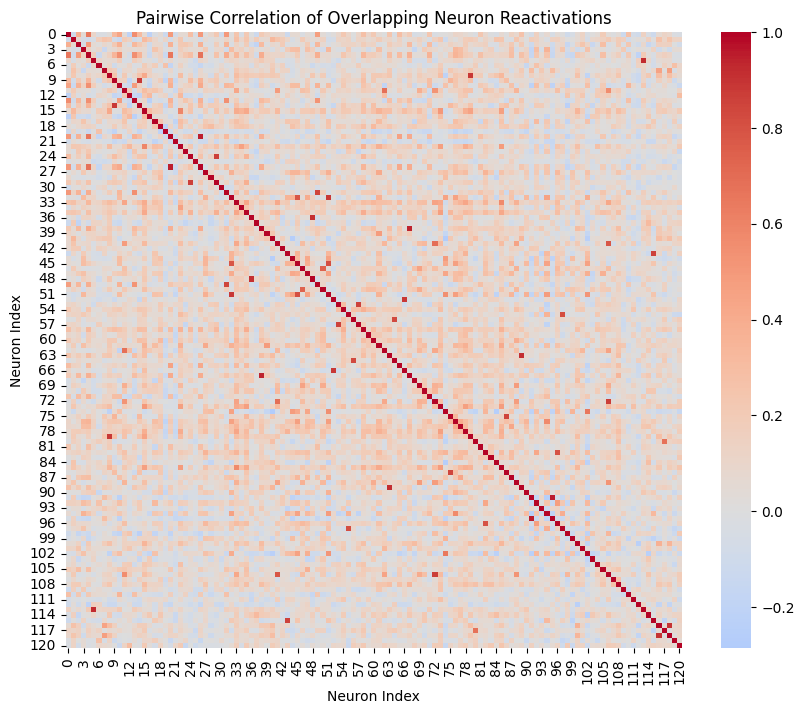

In [39]:
# Compute pairwise correlation
correlation_matrix = np.corrcoef(combined_overlap_activity.T)

# Plot correlation heatmap
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap="coolwarm", center=0, square=True)
plt.title("Pairwise Correlation of Overlapping Neuron Reactivations")
plt.xlabel("Neuron Index")
plt.ylabel("Neuron Index")
plt.show()


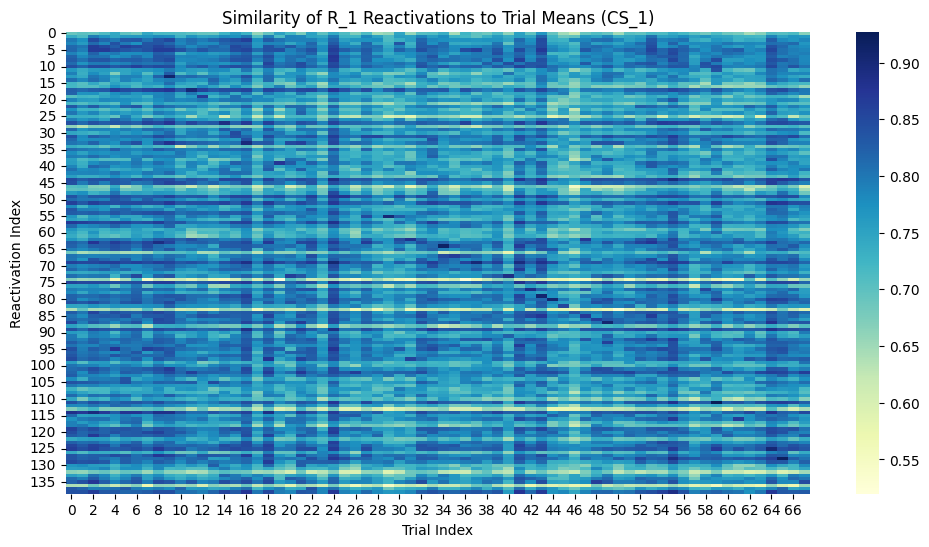

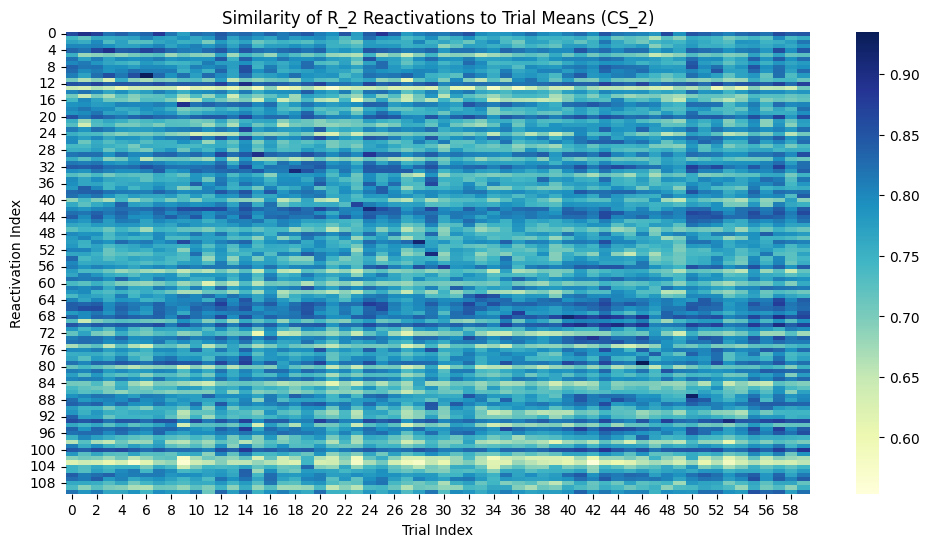

In [40]:

# Subset trial mean activity to include only overlapping neurons
subset_mean_activity_cs_1 = mean_activity_cs_1[:, overlap_neurons]
subset_mean_activity_cs_2 = mean_activity_cs_2[:, overlap_neurons]

# Calculate cosine similarity to trial means
similarity_to_trial_means_r1 = cosine_similarity(overlap_activity_r_1, subset_mean_activity_cs_1)
similarity_to_trial_means_r2 = cosine_similarity(overlap_activity_r_2, subset_mean_activity_cs_2)

# Plot heatmap of similarities for R_1
plt.figure(figsize=(12, 6))
sns.heatmap(similarity_to_trial_means_r1, cmap="YlGnBu", square=False)
plt.title("Similarity of R_1 Reactivations to Trial Means (CS_1)")
plt.xlabel("Trial Index")
plt.ylabel("Reactivation Index")
plt.show()

# Plot heatmap of similarities for R_2
plt.figure(figsize=(12, 6))
sns.heatmap(similarity_to_trial_means_r2, cmap="YlGnBu", square=False)
plt.title("Similarity of R_2 Reactivations to Trial Means (CS_2)")
plt.xlabel("Trial Index")
plt.ylabel("Reactivation Index")
plt.show()


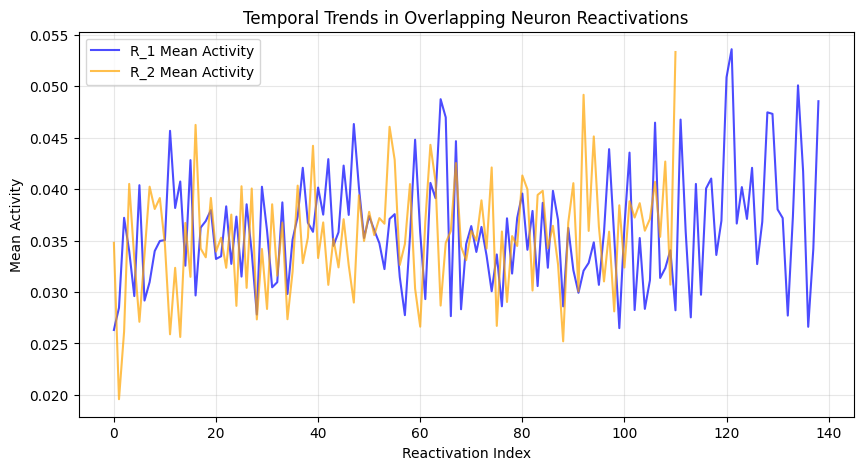

In [41]:
# Create separate time vectors for R_1 and R_2
time_vector_r1 = np.arange(overlap_activity_r_1.shape[0])  # Reactivations for R_1
time_vector_r2 = np.arange(overlap_activity_r_2.shape[0])  # Reactivations for R_2

# Calculate mean activity over time for R_1 and R_2
mean_activity_over_time_r1 = overlap_activity_r_1.mean(axis=1)
mean_activity_over_time_r2 = overlap_activity_r_2.mean(axis=1)

# Plot temporal trends for R_1 and R_2
plt.figure(figsize=(10, 5))
plt.plot(time_vector_r1, mean_activity_over_time_r1, label="R_1 Mean Activity", alpha=0.7, color="blue")
plt.plot(time_vector_r2, mean_activity_over_time_r2, label="R_2 Mean Activity", alpha=0.7, color="orange")
plt.title("Temporal Trends in Overlapping Neuron Reactivations")
plt.xlabel("Reactivation Index")
plt.ylabel("Mean Activity")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


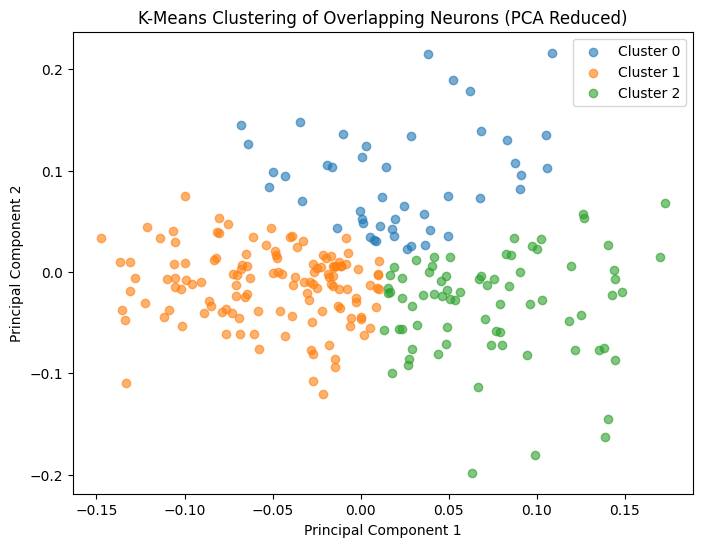

Cluster 0: R_1 vs R_2 Ratio: 20 vs 26
Cluster 1: R_1 vs R_2 Ratio: 72 vs 57
Cluster 2: R_1 vs R_2 Ratio: 47 vs 28


In [42]:
# Combine R_1 and R_2 overlapping neuron activities
combined_reactivations = np.vstack((overlap_activity_r_1, overlap_activity_r_2))
reactivation_labels = np.array([0] * overlap_activity_r_1.shape[0] + [1] * overlap_activity_r_2.shape[0])

# Perform K-Means clustering on PCA-reduced data
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=42).fit(pca_result)
cluster_labels = kmeans.labels_

# Plot clusters
plt.figure(figsize=(8, 6))
for cluster in np.unique(cluster_labels):
    plt.scatter(pca_result[cluster_labels == cluster, 0], pca_result[cluster_labels == cluster, 1],
                label=f'Cluster {cluster}', alpha=0.6)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering of Overlapping Neurons (PCA Reduced)')
plt.legend()
plt.show()

# Analyze trial indices associated with each cluster
cluster_trial_indices = [reactivation_labels[cluster_labels == cluster] for cluster in np.unique(cluster_labels)]
for cluster_idx, indices in enumerate(cluster_trial_indices):
    print(f"Cluster {cluster_idx}: R_1 vs R_2 Ratio: {np.sum(indices == 0)} vs {np.sum(indices == 1)}")


T-test: t-statistic = 1.05, p-value = 0.295


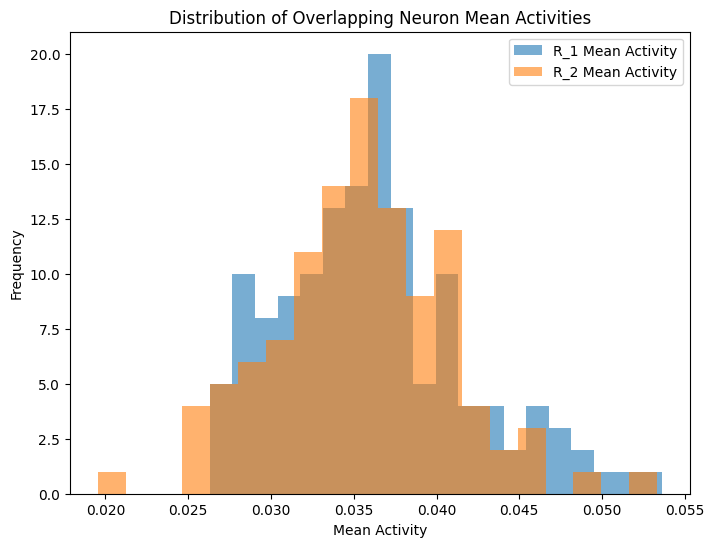

In [43]:
from scipy.stats import ttest_ind

# Compute mean activity of overlapping neurons
mean_activity_r1 = overlap_activity_r_1.mean(axis=1)
mean_activity_r2 = overlap_activity_r_2.mean(axis=1)

# Perform statistical comparison (t-test)
t_stat, p_value = ttest_ind(mean_activity_r1, mean_activity_r2)
print(f"T-test: t-statistic = {t_stat:.2f}, p-value = {p_value:.3f}")

# Plot distributions
plt.figure(figsize=(8, 6))
plt.hist(mean_activity_r1, bins=20, alpha=0.6, label='R_1 Mean Activity')
plt.hist(mean_activity_r2, bins=20, alpha=0.6, label='R_2 Mean Activity')
plt.xlabel('Mean Activity')
plt.ylabel('Frequency')
plt.title('Distribution of Overlapping Neuron Mean Activities')
plt.legend()
plt.show()


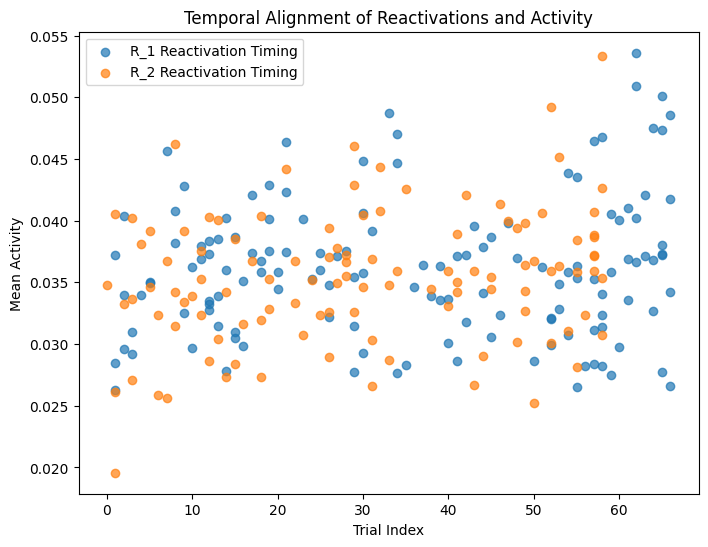

In [44]:
# Compute temporal alignment (e.g., reactivation timing vs trial index)
r1_reactivation_times = np.array(trial_r_1)  # Reactivation times for R_1
r2_reactivation_times = np.array(trial_r_2)  # Reactivation times for R_2

plt.figure(figsize=(8, 6))
plt.scatter(r1_reactivation_times, mean_activity_r1, alpha=0.7, label='R_1 Reactivation Timing')
plt.scatter(r2_reactivation_times, mean_activity_r2, alpha=0.7, label='R_2 Reactivation Timing')
plt.xlabel('Trial Index')
plt.ylabel('Mean Activity')
plt.title('Temporal Alignment of Reactivations and Activity')
plt.legend()
plt.show()


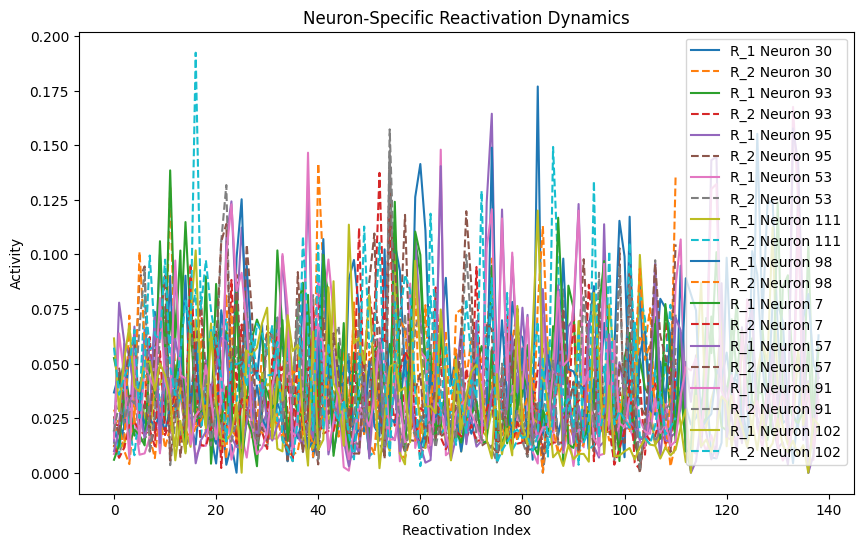

In [45]:
# Compute difference in mean activity for each overlapping neuron
neuron_differences = overlap_activity_r_1.mean(axis=0) - overlap_activity_r_2.mean(axis=0)

# Identify neurons with largest differences
top_neurons = np.argsort(np.abs(neuron_differences))[-10:]

# Plot the activity of these neurons
plt.figure(figsize=(10, 6))
for neuron in top_neurons:
    plt.plot(overlap_activity_r_1[:, neuron], label=f'R_1 Neuron {neuron}')
    plt.plot(overlap_activity_r_2[:, neuron], '--', label=f'R_2 Neuron {neuron}')
plt.xlabel('Reactivation Index')
plt.ylabel('Activity')
plt.title('Neuron-Specific Reactivation Dynamics')
plt.legend()
plt.show()


# analysis whether top stimulus encoding neurons are also in reactivation subset

In [46]:
def normalized_trial_averaged_first_30(activity, behavior, trial_type):
    """
    Makes normalized trial-averaged trace for the first 30 frames for each cue type.
    :param activity: fluorescence (DataFrame)
    :param behavior: dict of behavior
    :param trial_type: type of trial ('cs_1' or 'cs_2')
    :return: trial-averaged activity for the first 30 frames
    """
    #activity = activity.to_numpy()
    index_frames = []
    num_trials = 0
    trial_times = behavior['onsets'][behavior['cue_codes'] == behavior[trial_type + '_code']]
    
    # Gather indices for the first 30 frames of each trial
    for i in trial_times:
        if i > 0:
            num_trials += 1
            for j in range(0, 30):  # Limit to first 30 frames
                index_frames.append(int(i) + j)
    
    # Extract activity for the selected indices
    activity_task_idx = activity[:, index_frames]
    activity_task_idx = np.reshape(activity_task_idx, (activity_task_idx.shape[0], num_trials, 30))
    
    # Compute the mean activity across trials
    activity_task_mean = pd.DataFrame(activity_task_idx.mean(axis=1))
    
    # Normalize by subtracting the baseline (mean of first few frames)
    baseline_frames = behavior['frames_before']  # Adjust if behavior defines a baseline window
    activity_task_mean_df = activity_task_mean.subtract(
        activity_task_mean.iloc[:, :baseline_frames].mean(axis=1), axis=0)
    
    return activity_task_mean_df


# Extract top 10% active neurons based on the mean activity for CS_1 and CS_2
def extract_top_10_percent_neurons(activity_task_mean_df):
    """
    Extract indices of the top 10% active neurons.
    :param activity_task_mean_df: DataFrame of mean activity for neurons
    :return: indices of top 10% neurons
    """
    mean_activity = activity_task_mean_df.mean(axis=1)  # Compute mean activity across frames
    threshold = np.percentile(mean_activity, 90)  # Top 10% threshold
    top_neurons_indices = np.where(mean_activity >= threshold)[0]  # Indices of top 10% neurons
    return top_neurons_indices

mean_activity_cs_1 = normalized_trial_averaged_first_30(activity, behavior, 'cs_1')
mean_activity_cs_2 = normalized_trial_averaged_first_30(activity, behavior, 'cs_2')

top_10_percent_cs_1 = extract_top_10_percent_neurons(mean_activity_cs_1)
top_10_percent_cs_2 = extract_top_10_percent_neurons(mean_activity_cs_2)

print(len(top_10_percent_cs_1), len(top_10_percent_cs_2))



313 313


Overlap between Top 10% CS_1 and R_1 Neurons: 28
Fractional Overlap: 0.06
Overlap between Top 10% CS_2 and R_2 Neurons: 32
Fractional Overlap: 0.07


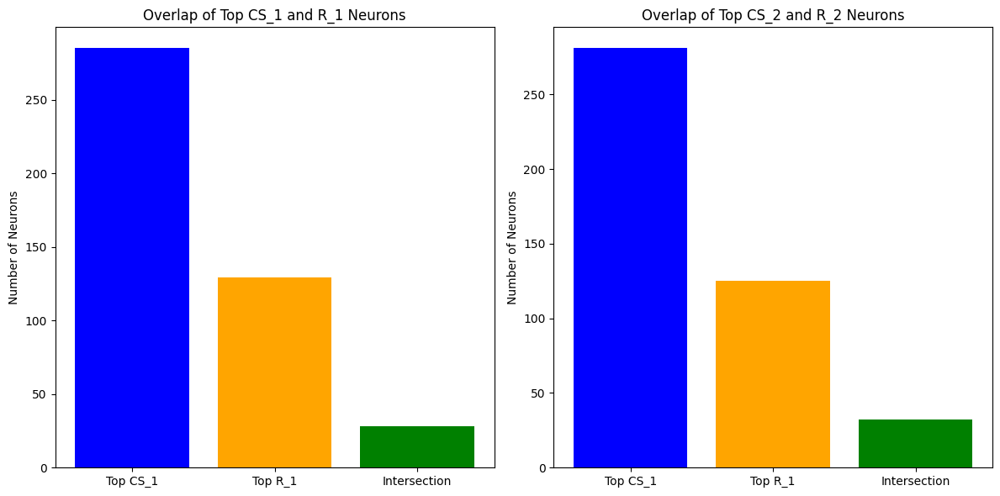

In [47]:
def compute_overlap_indices(set1, set2):
    """
    Compute the overlap between two sets of neuron indices.
    :param set1: Set of indices (e.g., top 10% CS neurons)
    :param set2: Set of indices (e.g., top 10% R neurons)
    :return: Tuple (overlapping indices, overlap fraction)
    """
    intersection = set1 & set2  # Neurons present in both sets
    union = set1 | set2  # All unique neurons in both sets
    overlap_fraction = len(intersection) / len(union) if len(union) > 0 else 0
    return intersection, overlap_fraction


# Convert the arrays to sets for easy comparison
top_cs_1_set = set(top_10_percent_cs_1)
top_cs_2_set = set(top_10_percent_cs_2)
top_r_1_set = set(top_r_1_indices)
top_r_2_set = set(top_r_2_indices)

# Compute overlaps
cs1_r1_overlap, cs1_r1_fraction = compute_overlap_indices(top_cs_1_set, top_r_1_set)
cs2_r2_overlap, cs2_r2_fraction = compute_overlap_indices(top_cs_2_set, top_r_2_set)

# Print Results
print(f"Overlap between Top 10% CS_1 and R_1 Neurons: {len(cs1_r1_overlap)}")
print(f"Fractional Overlap: {cs1_r1_fraction:.2f}")

print(f"Overlap between Top 10% CS_2 and R_2 Neurons: {len(cs2_r2_overlap)}")
print(f"Fractional Overlap: {cs2_r2_fraction:.2f}")

# Visualize overlaps
import matplotlib.pyplot as plt

# Prepare data for plotting
labels = ['Top CS_1', 'Top R_1', 'Intersection']
sizes_cs1_r1 = [len(top_cs_1_set - cs1_r1_overlap), len(top_r_1_set - cs1_r1_overlap), len(cs1_r1_overlap)]
sizes_cs2_r2 = [len(top_cs_2_set - cs2_r2_overlap), len(top_r_2_set - cs2_r2_overlap), len(cs2_r2_overlap)]

# Plot overlaps for CS_1 vs R_1
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.bar(labels, sizes_cs1_r1, color=['blue', 'orange', 'green'])
plt.title("Overlap of Top CS_1 and R_1 Neurons")
plt.ylabel("Number of Neurons")

# Plot overlaps for CS_2 vs R_2
plt.subplot(1, 2, 2)
plt.bar(labels, sizes_cs2_r2, color=['blue', 'orange', 'green'])
plt.title("Overlap of Top CS_2 and R_2 Neurons")
plt.ylabel("Number of Neurons")

plt.tight_layout()
plt.show()


Overlap between CS_1 encoding neurons and R_1: 28 / 442 (Jaccard: 0.06)
Overlap between CS_1 encoding neurons and R_2: 31 / 439 (Jaccard: 0.07)
Overlap between CS_2 encoding neurons and R_2: 32 / 438 (Jaccard: 0.07)
Overlap between CS_2 encoding neurons and R_1: 25 / 445 (Jaccard: 0.06)
Overlap between CS_1 and CS_2 encoding neurons: 108 / 518 (Jaccard: 0.21)


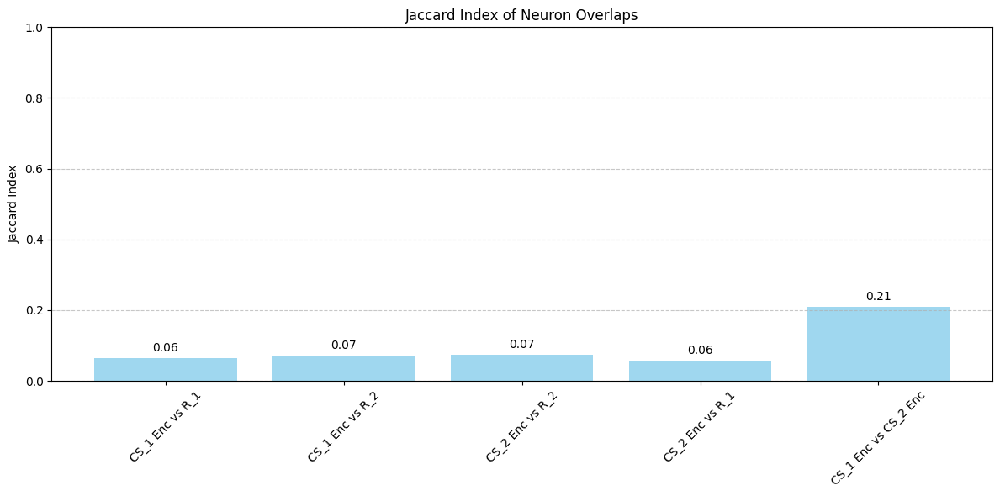

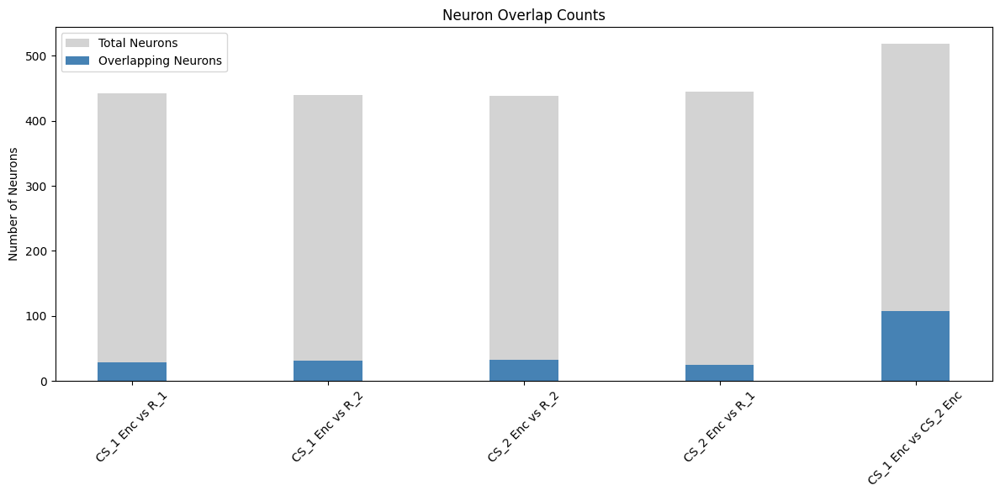

In [48]:
def compute_overlap_indices(set1, set2):
    """
    Compute the overlap between two sets of neuron indices.
    :param set1: Set of indices (e.g., top 10% CS neurons)
    :param set2: Set of indices (e.g., top 10% R neurons)
    :return: Tuple (overlapping indices, overlap fraction)
    """
    intersection = set1 & set2  # Neurons present in both sets
    union = set1 | set2  # All unique neurons in both sets
    overlap_fraction = len(intersection) / len(union) if len(union) > 0 else 0
    return len(intersection), len(union), overlap_fraction


# Convert arrays to sets for easy comparison
top_cs_1_set = set(top_10_percent_cs_1)
top_cs_2_set = set(top_10_percent_cs_2)
top_r_1_set = set(top_r_1_indices)
top_r_2_set = set(top_r_2_indices)

# Compute overlaps for all conditions
overlap_cs1enc_r1 = compute_overlap_indices(top_cs_1_set, top_r_1_set)
overlap_cs1enc_r2 = compute_overlap_indices(top_cs_1_set, top_r_2_set)
overlap_cs2enc_r2 = compute_overlap_indices(top_cs_2_set, top_r_2_set)
overlap_cs2enc_r1 = compute_overlap_indices(top_cs_2_set, top_r_1_set)
overlap_cs1enc_cs2enc = compute_overlap_indices(top_cs_1_set, top_cs_2_set)

# Print results
print(f"Overlap between CS_1 encoding neurons and R_1: {overlap_cs1enc_r1[0]} / {overlap_cs1enc_r1[1]} (Jaccard: {overlap_cs1enc_r1[2]:.2f})")
print(f"Overlap between CS_1 encoding neurons and R_2: {overlap_cs1enc_r2[0]} / {overlap_cs1enc_r2[1]} (Jaccard: {overlap_cs1enc_r2[2]:.2f})")
print(f"Overlap between CS_2 encoding neurons and R_2: {overlap_cs2enc_r2[0]} / {overlap_cs2enc_r2[1]} (Jaccard: {overlap_cs2enc_r2[2]:.2f})")
print(f"Overlap between CS_2 encoding neurons and R_1: {overlap_cs2enc_r1[0]} / {overlap_cs2enc_r1[1]} (Jaccard: {overlap_cs2enc_r1[2]:.2f})")
print(f"Overlap between CS_1 and CS_2 encoding neurons: {overlap_cs1enc_cs2enc[0]} / {overlap_cs1enc_cs2enc[1]} (Jaccard: {overlap_cs1enc_cs2enc[2]:.2f})")

# Prepare data for visualization
conditions = [
    "CS_1 Enc vs R_1",
    "CS_1 Enc vs R_2",
    "CS_2 Enc vs R_2",
    "CS_2 Enc vs R_1",
    "CS_1 Enc vs CS_2 Enc",
]
overlap_sizes = [
    overlap_cs1enc_r1[0],
    overlap_cs1enc_r2[0],
    overlap_cs2enc_r2[0],
    overlap_cs2enc_r1[0],
    overlap_cs1enc_cs2enc[0],
]
total_sizes = [
    overlap_cs1enc_r1[1],
    overlap_cs1enc_r2[1],
    overlap_cs2enc_r2[1],
    overlap_cs2enc_r1[1],
    overlap_cs1enc_cs2enc[1],
]
jaccard_indices = [
    overlap_cs1enc_r1[2],
    overlap_cs1enc_r2[2],
    overlap_cs2enc_r2[2],
    overlap_cs2enc_r1[2],
    overlap_cs1enc_cs2enc[2],
]

# Plot bar chart for Jaccard indices
plt.figure(figsize=(12, 6))
plt.bar(conditions, jaccard_indices, color="skyblue", alpha=0.8)
plt.ylabel("Jaccard Index")
plt.title("Jaccard Index of Neuron Overlaps")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Annotate bar heights
for i, jaccard in enumerate(jaccard_indices):
    plt.text(i, jaccard + 0.02, f"{jaccard:.2f}", ha="center", fontsize=10)

plt.tight_layout()
plt.show()

# Plot overlapping and total sizes
plt.figure(figsize=(12, 6))
bar_width = 0.35
indices = np.arange(len(conditions))

plt.bar(indices, total_sizes, bar_width, label="Total Neurons", color="lightgray")
plt.bar(indices, overlap_sizes, bar_width, label="Overlapping Neurons", color="steelblue")

plt.ylabel("Number of Neurons")
plt.title("Neuron Overlap Counts")
plt.xticks(indices, conditions, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


# further analysis shared r1 and r2 neurons

In [49]:
print(overlap_indices)
print(unique_r1_indices)
print(unique_r2_indices)

[0, 1031, 8, 2057, 10, 2568, 2569, 1039, 2583, 25, 26, 539, 1565, 29, 33, 1058, 3115, 2093, 558, 3119, 48, 3121, 563, 2612, 53, 3123, 56, 2104, 2622, 69, 2558, 75, 1099, 81, 2645, 90, 2140, 1644, 111, 2681, 635, 1151, 640, 1667, 2184, 1674, 1676, 1682, 1689, 157, 1184, 1699, 1700, 1189, 168, 1193, 682, 2220, 173, 2736, 179, 1716, 2229, 183, 699, 188, 1725, 193, 2755, 2756, 2247, 207, 2767, 237, 2803, 247, 249, 256, 259, 772, 1295, 1812, 1305, 2842, 2338, 295, 822, 315, 1353, 332, 1884, 2909, 869, 1384, 2920, 2923, 1388, 1914, 1925, 1927, 2461, 417, 1960, 942, 1454, 439, 951, 955, 970, 1996, 2002, 3032, 3034, 1499, 3037, 3043, 2029, 499, 2547, 3070, 1535]
[2433, 2824, 268, 1182, 1954, 678, 296, 809, 1834, 2858, 2092, 939, 2737, 306, 692, 820, 313, 3002, 2491, 1085, 575, 2760, 1738, 851, 2775, 3031, 89, 484, 742, 359, 2157, 2285, 2288, 1778, 1909, 1406]
[4, 2566, 9, 2441, 3084, 1422, 2960, 17, 21, 2584, 2587, 2975, 2977, 37, 423, 3114, 1714, 2873, 445, 451, 967, 1868, 2895, 1110, 100, 13

Correlation between overlapping neuron activity in R1 and R2: 0.72 (p-value: 7.31e-21)
Mean activity of overlapping neurons in R1: 0.036148612515159086
Mean activity of overlapping neurons in R2: 0.03540626250280417
Mean activity of unique neurons in R1: 0.03204429259040617
Mean activity of unique neurons in R2: 0.031599754164456886


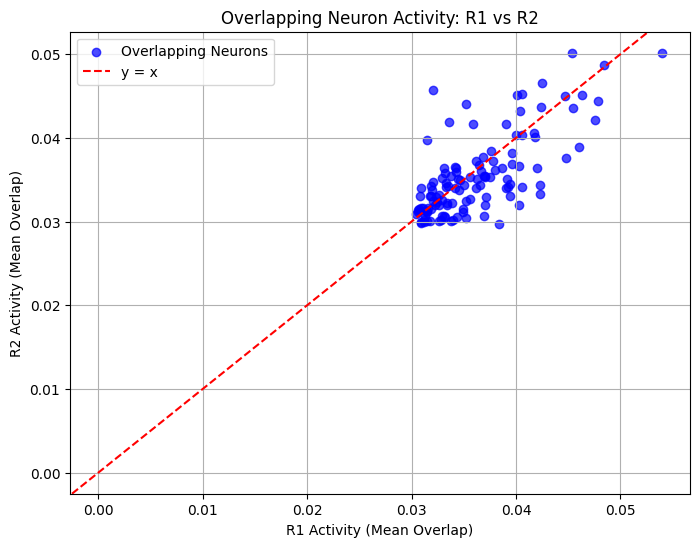

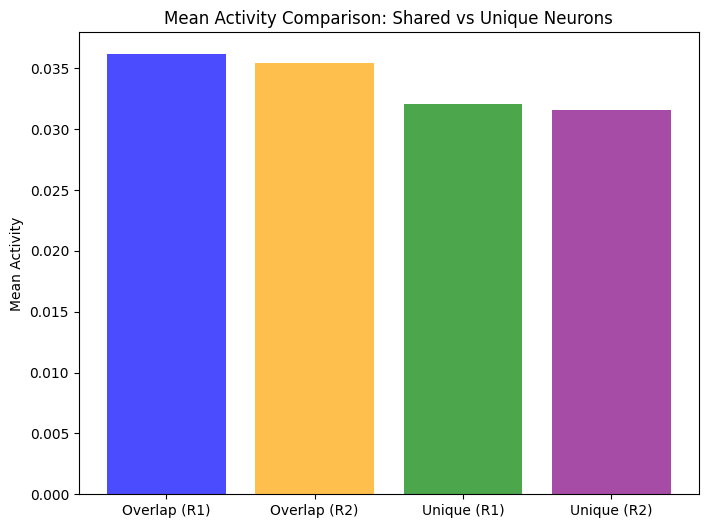

In [50]:
from scipy.stats import pearsonr

# Step 1: Correlation analysis of overlapping neurons
overlap_activity_r1 = mean_activity_r_1[:, overlap_indices].mean(axis=0)
overlap_activity_r2 = mean_activity_r_2[:, overlap_indices].mean(axis=0)

# Compute the correlation
correlation_coefficient, p_value = pearsonr(overlap_activity_r1, overlap_activity_r2)
print(f"Correlation between overlapping neuron activity in R1 and R2: {correlation_coefficient:.2f} (p-value: {p_value:.2e})")

# Step 2: Compute mean activity for shared and unique neurons
mean_overlap_r1 = mean_activity_r_1[:, overlap_indices].mean()
mean_overlap_r2 = mean_activity_r_2[:, overlap_indices].mean()

mean_unique_r1 = mean_activity_r_1[:, unique_r1_indices].mean() if unique_r1_indices else 0
mean_unique_r2 = mean_activity_r_2[:, unique_r2_indices].mean() if unique_r2_indices else 0

print(f"Mean activity of overlapping neurons in R1: {mean_overlap_r1}")
print(f"Mean activity of overlapping neurons in R2: {mean_overlap_r2}")
print(f"Mean activity of unique neurons in R1: {mean_unique_r1}")
print(f"Mean activity of unique neurons in R2: {mean_unique_r2}")

# Step 3: Visualization

# Scatter plot of overlapping neuron activity in R1 vs R2
plt.figure(figsize=(8, 6))
plt.scatter(overlap_activity_r1, overlap_activity_r2, c='blue', alpha=0.7, label="Overlapping Neurons")
plt.axline((0, 0), slope=1, color='red', linestyle='--', label="y = x")
plt.title("Overlapping Neuron Activity: R1 vs R2")
plt.xlabel("R1 Activity (Mean Overlap)")
plt.ylabel("R2 Activity (Mean Overlap)")
plt.legend()
plt.grid(True)
plt.show()

# Bar plot of mean activity for shared and unique neurons
categories = ['Overlap (R1)', 'Overlap (R2)', 'Unique (R1)', 'Unique (R2)']
values = [mean_overlap_r1, mean_overlap_r2, mean_unique_r1, mean_unique_r2]

plt.figure(figsize=(8, 6))
plt.bar(categories, values, color=['blue', 'orange', 'green', 'purple'], alpha=0.7)
plt.title("Mean Activity Comparison: Shared vs Unique Neurons")
plt.ylabel("Mean Activity")
plt.show()


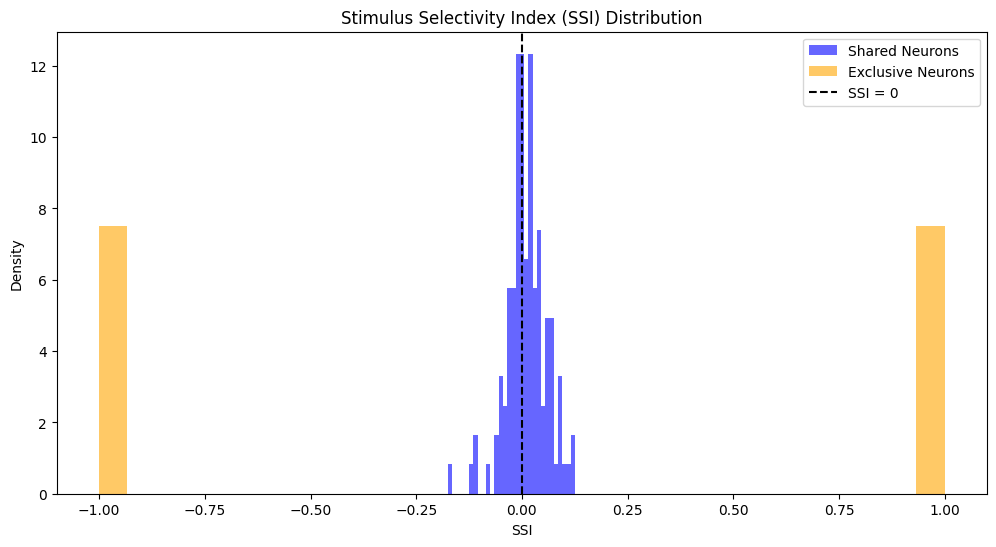

T-test between shared and exclusive neurons: t-stat=0.090, p-value=9.285e-01


In [51]:
# Compute SSI for shared and exclusive neurons
def compute_ssi(mean_activity_r1, mean_activity_r2):
    return (mean_activity_r1 - mean_activity_r2) / (mean_activity_r1 + mean_activity_r2 + 1e-10)  # Avoid divide-by-zero

ssi_shared = compute_ssi(
    mean_activity_r_1[:, overlap_indices].mean(axis=0), 
    mean_activity_r_2[:, overlap_indices].mean(axis=0)
)

ssi_exclusive_r1 = compute_ssi(
    mean_activity_r_1[:, unique_r1_indices].mean(axis=0), 
    np.zeros(len(unique_r1_indices))
)

ssi_exclusive_r2 = compute_ssi(
    np.zeros(len(unique_r2_indices)), 
    mean_activity_r_2[:, unique_r2_indices].mean(axis=0)
)

# Combine SSI results for visualization
ssi_exclusive = np.concatenate([ssi_exclusive_r1, ssi_exclusive_r2])

# Plot SSI Distributions
plt.figure(figsize=(12, 6))
plt.hist(ssi_shared, bins=30, alpha=0.6, label='Shared Neurons', color='blue', density=True)
plt.hist(ssi_exclusive, bins=30, alpha=0.6, label='Exclusive Neurons', color='orange', density=True)
plt.axvline(0, color='black', linestyle='--', label='SSI = 0')
plt.title('Stimulus Selectivity Index (SSI) Distribution')
plt.xlabel('SSI')
plt.ylabel('Density')
plt.legend()
plt.show()

# Statistical Comparison (optional)
from scipy.stats import ttest_ind

t_stat, p_value = ttest_ind(ssi_shared, ssi_exclusive, equal_var=False)
print(f"T-test between shared and exclusive neurons: t-stat={t_stat:.3f}, p-value={p_value:.3e}")


# do these shared reactivation neurons drive representational drift?

In [69]:
print(mean_activity_cs_1.shape)

AttributeError: 'list' object has no attribute 'shape'

In [66]:
import numpy as np
from scipy.spatial.distance import euclidean
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression


# Step 1: Compute Reactivation Drift
def compute_drift_euc(mean_activity):
    # Compute drift as Euclidean distance between consecutive trials
    drift = np.array([
        euclidean(mean_activity[i], mean_activity[i + 1]) 
        for i in range(len(mean_activity) - 1)
    ])
    return drift

drift_cs_1 = compute_drift_euc(mean_activity_cs_1)
drift_cs_2 = compute_drift_euc(mean_activity_cs_2)

# Step 2: Compute Overlapping Neurons' Contribution
overlapping_activity_cs_1 = mean_activity_cs_1[:, overlap_indices].mean(axis=1)
overlapping_activity_cs_2 = mean_activity_cs_2[:, overlap_indices].mean(axis=1)

# Step 3: Correlate Overlapping Neuron Activity with Reactivation Drift
corr_cs_1, p_cs_1 = pearsonr(overlapping_activity_cs_1[:-1], drift_cs_1)
corr_cs_2, p_cs_2 = pearsonr(overlapping_activity_cs_2[:-1], drift_cs_2)

print(f"Correlation (CS1): {corr_cs_1:.3f}, p-value: {p_cs_1:.3e}")
print(f"Correlation (CS2): {corr_cs_2:.3f}, p-value: {p_cs_2:.3e}")

# Step 4: Regression to Partial Out Non-Overlapping Neurons
non_overlapping_activity_cs_1 = mean_activity_cs_1[:, unique_r1_indices].mean(axis=1)
non_overlapping_activity_cs_2 = mean_activity_cs_2[:, unique_r2_indices].mean(axis=1)

# Linear regression: Drift as a function of overlapping and non-overlapping activity
X_cs_1 = np.column_stack([overlapping_activity_cs_1[:-1], non_overlapping_activity_cs_1[:-1]])
X_cs_2 = np.column_stack([overlapping_activity_cs_2[:-1], non_overlapping_activity_cs_2[:-1]])

regressor_cs_1 = LinearRegression().fit(X_cs_1, drift_cs_1)
regressor_cs_2 = LinearRegression().fit(X_cs_2, drift_cs_2)

print(f"CS1 Regression Coefficients (Overlap, Non-Overlap): {regressor_cs_1.coef_}")
print(f"CS2 Regression Coefficients (Overlap, Non-Overlap): {regressor_cs_2.coef_}")

plt.figure(figsize=(12, 6))
plt.scatter(overlapping_activity_cs_1[:-1], drift_cs_1, label='CS1', alpha=0.7)
plt.scatter(overlapping_activity_cs_2[:-1], drift_cs_2, label='CS2', alpha=0.7)
plt.xlabel('Overlapping Neuron Activity')
plt.ylabel('Reactivation Drift')
plt.title('Relationship Between Overlapping Neurons and Reactivation Drift')
plt.legend()
plt.show()


TypeError: list indices must be integers or slices, not tuple

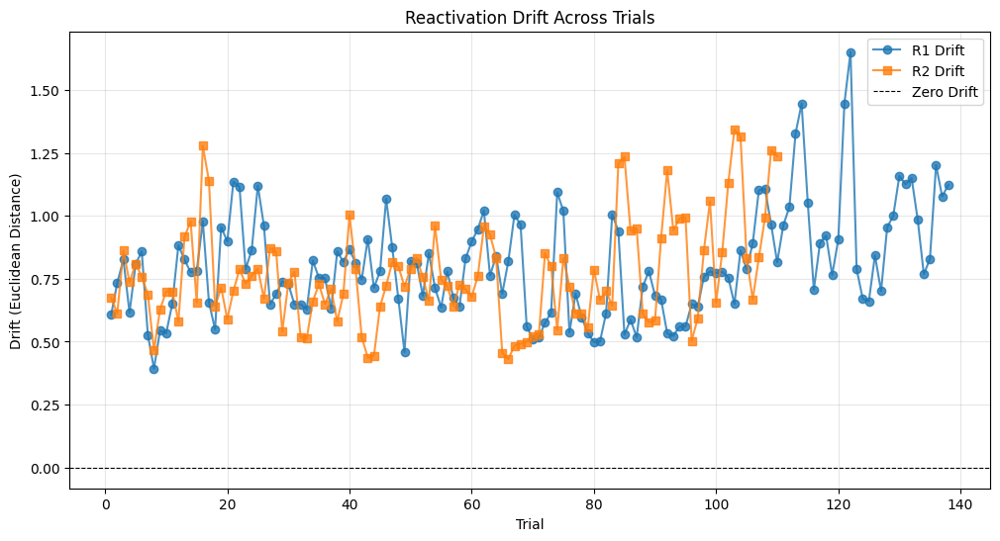

In [56]:
drift_r_1 = compute_drift_euc(mean_activity_r_1)
drift_r_2 = compute_drift_euc(mean_activity_r_2)
# Visualize Drifts Across Trials
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(drift_r_1) + 1), drift_r_1, marker='o', label='R1 Drift', alpha=0.8)
plt.plot(range(1, len(drift_r_2) + 1), drift_r_2, marker='s', label='R2 Drift', alpha=0.8)
plt.axhline(0, color='black', linestyle='--', linewidth=0.8, label='Zero Drift')
plt.xlabel('Trial')
plt.ylabel('Drift (Euclidean Distance)')
plt.title('Reactivation Drift Across Trials')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

67
7.020022880523038


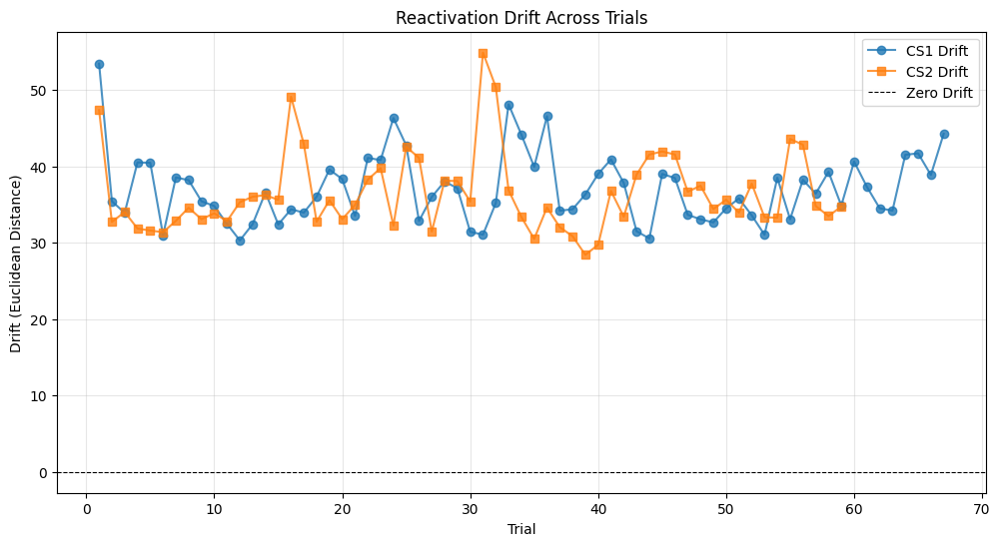

In [ ]:
print(len(drift_cs_1))
print(mean_activity_cs_1.max())

# Visualize Drifts Across Trials
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(drift_cs_1) + 1), drift_cs_1, marker='o', label='CS1 Drift', alpha=0.8)
plt.plot(range(1, len(drift_cs_2) + 1), drift_cs_2, marker='s', label='CS2 Drift', alpha=0.8)
plt.axhline(0, color='black', linestyle='--', linewidth=0.8, label='Zero Drift')
plt.xlabel('Trial')
plt.ylabel('Drift (Euclidean Distance)')
plt.title('Reactivation Drift Across Trials')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

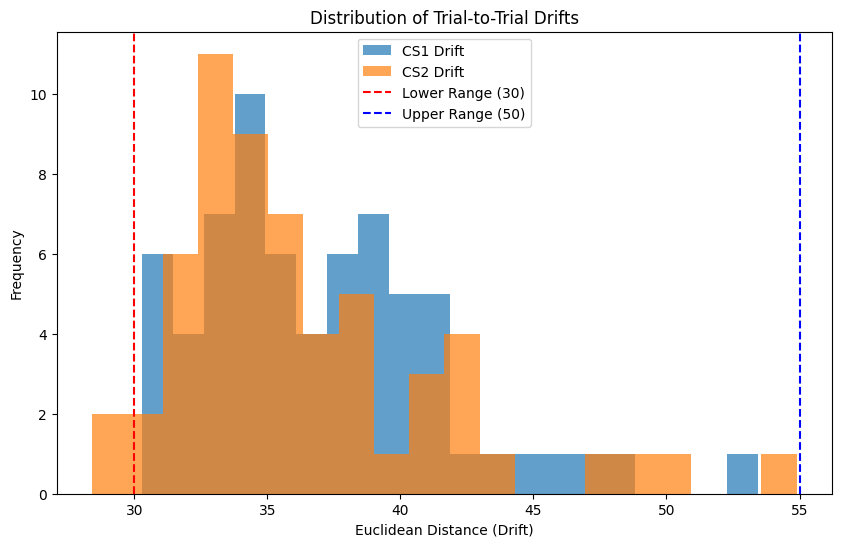

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(drift_cs_1, bins=20, alpha=0.7, label='CS1 Drift')
plt.hist(drift_cs_2, bins=20, alpha=0.7, label='CS2 Drift')
plt.axvline(30, color='red', linestyle='--', label='Lower Range (30)')
plt.axvline(55, color='blue', linestyle='--', label='Upper Range (50)')
plt.xlabel('Euclidean Distance (Drift)')
plt.ylabel('Frequency')
plt.title('Distribution of Trial-to-Trial Drifts')
plt.legend() 
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import numpy as np
import matplotlib.pyplot as plt

overlapping_activity_cs_1 = mean_activity_r_1[:, overlap_indices]
overlapping_activity_cs_2 = mean_activity_r_2[:, overlap_indices]
print(overlapping_activity_cs_1.shape, overlapping_activity_cs_2.shape)

# Step 1: Compute Drift for All Neurons
def compute_drift_per_trial(activity_matrix):
    """
    Compute drift (current trial - previous trial) for each neuron.
    :param activity_matrix: Trials x Neurons matrix of activity
    :return: Drift matrix (Trials-1 x Neurons)
    """
    return activity_matrix[1:, :] - activity_matrix[:-1, :]

# Compute drift for CS_1 and CS_2
drift_cs_1 = compute_drift_per_trial(mean_activity_cs_1)  # Shape: (trials-1, neurons)
drift_cs_2 = compute_drift_per_trial(mean_activity_cs_2)  # Shape: (trials-1, neurons)


(139, 121) (111, 121)
(3124,)


TypeError: list indices must be integers or slices, not tuple

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score

# Replicate drift trials based on trial_r_1
replicated_drift_cs_1 = drift_cs_1[trial_r_1]  # Replicate rows using trial_r_1 indices

# Confirm new shape alignment
assert replicated_drift_cs_1.shape[0] == overlapping_activity_cs_1.shape[0], \
    "Replicated drift dataset does not match the length of overlapping activity!"

# Step 2: Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    overlapping_activity_cs_1, replicated_drift_cs_1, test_size=0.3, random_state=42
)

# Step 3: Fit a regression model
ridge = Ridge(alpha=1.0)  # Regularized regression
ridge.fit(X_train, y_train)

# Step 4: Predict on test data
y_pred = ridge.predict(X_test)

# Step 5: Evaluate performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R² Score: {r2:.4f}")

# Step 6: Cross-prediction (optional)
# Repeat the same process for CS_2
replicated_drift_cs_2 = drift_cs_2[trial_r_2]
assert replicated_drift_cs_2.shape[0] == overlapping_activity_cs_2.shape[0], \
    "Replicated drift dataset for CS_2 does not match the length of overlapping activity!"

y_pred_cross = ridge.predict(overlapping_activity_cs_2)
mse_cross = mean_squared_error(replicated_drift_cs_2, y_pred_cross)
r2_cross = r2_score(replicated_drift_cs_2, y_pred_cross)

print(f"Cross-Prediction MSE: {mse_cross:.4f}")
print(f"Cross-Prediction R²: {r2_cross:.4f}")


Mean Squared Error (MSE): 0.4263
R² Score: -0.0283
Cross-Prediction MSE: 0.4399
Cross-Prediction R²: -0.0223


In [ ]:
# Identify overlapping and unique neurons
overlap_neurons = list(top_r_1_indices & top_r_2_indices)
unique_r1 = list(top_r_1_indices - top_r_2_indices)
unique_r2 = list(top_r_2_indices - top_r_1_indices)

overlap_activity_r_1 = mean_activity_r_1[:, overlap_neurons]  # Reactivations x Overlapping Neurons
overlap_activity_r_2 = mean_activity_r_2[:, overlap_neurons]

overlap_activity_cs_1 = mean_activity_cs_1[:, overlap_neurons]  # Trials x Overlapping Neurons
overlap_activity_cs_2 = mean_activity_cs_2[:, overlap_neurons]

def compute_drift_per_trial(activity_matrix):
    """
    Compute drift (current trial - previous trial) for each neuron.
    :param activity_matrix: Trials x Neurons matrix of activity
    :return: Drift matrix (Trials-1 x Neurons)
    """
    return activity_matrix[1:, :] - activity_matrix[:-1, :]

drift_cs_1 = compute_drift_per_trial(mean_activity_cs_1)  # Shape: (trials-1, neurons)
drift_cs_2 = compute_drift_per_trial(mean_activity_cs_2)  # Shape: (trials-1, neurons)


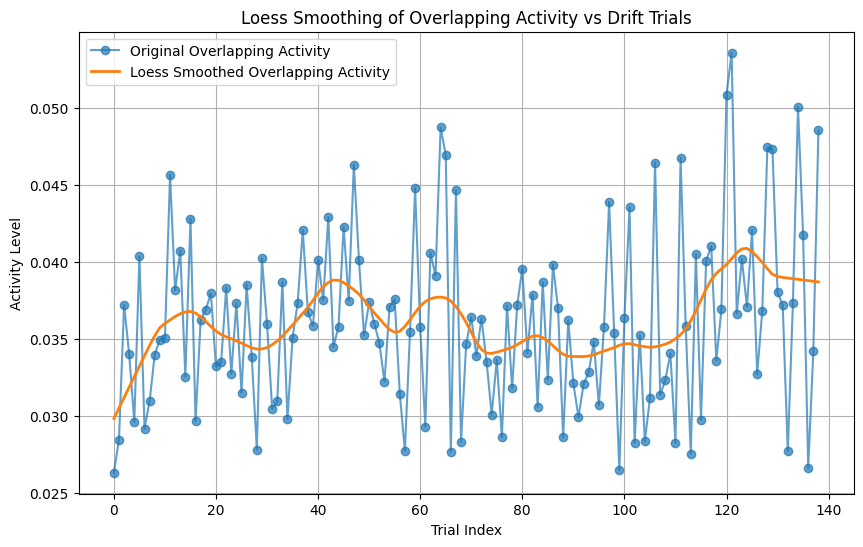

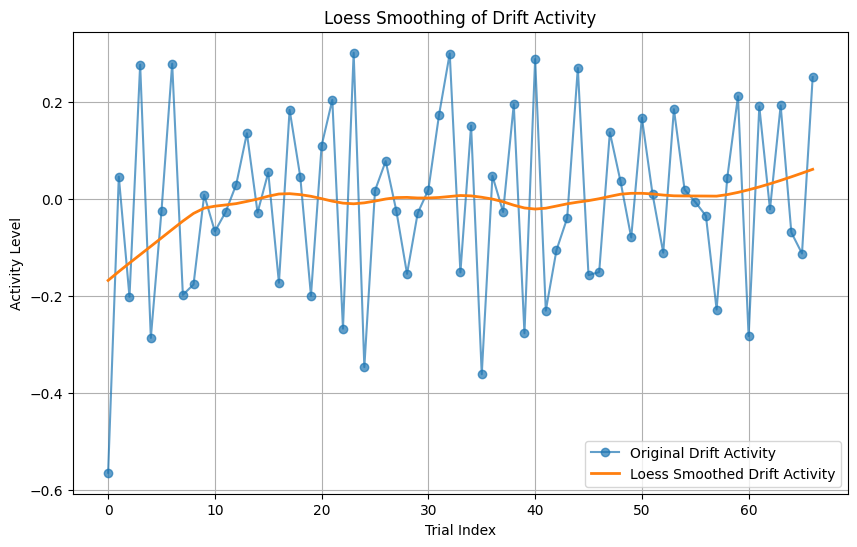

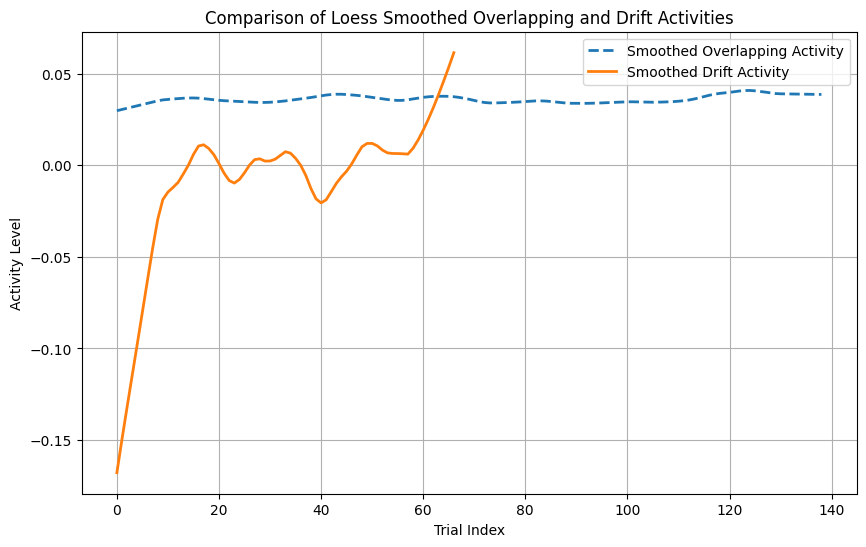

In [ ]:
from plot import Loess

# Assuming drift_cs_1 and overlapping_activity_cs_1 are already aligned
# Convert to 1D for Loess (aggregate trials by mean if needed)
mean_drift_cs_1 = drift_cs_1.mean(axis=1)  # Mean across neurons for each trial
mean_overlap_cs_1 = overlap_activity_cs_1.mean(axis=1)  # Mean across neurons for each overlapping trial

# Define Loess model for smoothing
xx = list(range(len(mean_overlap_cs_1)))  # Trial indices for overlapping activity
yy = mean_overlap_cs_1  # Overlapping activity mean values
loess = Loess(xx, yy)

# Apply Loess smoothing
x_plot = []
y_plot = []
window_size = 8 # Define a reasonable window size
# Extend Loess smoothing to cover edges by extrapolating missing points
for x in range(len(mean_overlap_cs_1)):
    if x < window_size or x > len(mean_overlap_cs_1) - window_size:  # Edge extrapolation
        y = loess.estimate(x, window=window_size, use_matrix=False, degree=1)
    else:
        y = loess.estimate(x, window=window_size, use_matrix=False, degree=1)
    x_plot.append(x)
    y_plot.append(y)

# Plot original vs smoothed data
plt.figure(figsize=(10, 6))
plt.plot(xx, mean_overlap_cs_1, label="Original Overlapping Activity", alpha=0.7, marker='o')
plt.plot(x_plot, y_plot, label="Loess Smoothed Overlapping Activity", linewidth=2)
plt.title("Loess Smoothing of Overlapping Activity vs Drift Trials")
plt.xlabel("Trial Index")
plt.ylabel("Activity Level")
plt.legend()
plt.grid()
plt.show()

# Repeat for drift dataset
xx_drift = list(range(len(mean_drift_cs_1)))
yy_drift = mean_drift_cs_1
loess_drift = Loess(xx_drift, yy_drift)

x_plot_drift = []
y_plot_drift = []
for x in range(len(mean_drift_cs_1)):
    y = loess_drift.estimate(x, window=window_size, use_matrix=False, degree=1)
    x_plot_drift.append(x)
    y_plot_drift.append(y)

# Plot drift data
plt.figure(figsize=(10, 6))
plt.plot(xx_drift, mean_drift_cs_1, label="Original Drift Activity", alpha=0.7, marker='o')
plt.plot(x_plot_drift, y_plot_drift, label="Loess Smoothed Drift Activity", linewidth=2)
plt.title("Loess Smoothing of Drift Activity")
plt.xlabel("Trial Index")
plt.ylabel("Activity Level")
plt.legend()
plt.grid()
plt.show()

# Comparison plot of both Loess-smoothed datasets
plt.figure(figsize=(10, 6))
plt.plot(x_plot, y_plot, label="Smoothed Overlapping Activity", linewidth=2, linestyle='--')
plt.plot(x_plot_drift, y_plot_drift, label="Smoothed Drift Activity", linewidth=2, linestyle='-')
plt.title("Comparison of Loess Smoothed Overlapping and Drift Activities")
plt.xlabel("Trial Index")
plt.ylabel("Activity Level")
plt.legend()
plt.grid()
plt.show()



In [ ]:
# Calculate residuals for overlapping activity
residuals_overlap = mean_overlap_cs_1 - y_plot
residuals_drift = mean_drift_cs_1 - y_plot_drift

# Plot residuals
plt.figure(figsize=(10, 6))
plt.scatter(xx, residuals_overlap, label="Residuals for Overlapping Activity", alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.title("Residuals for Overlapping Activity")
plt.xlabel("Trial Index")
plt.ylabel("Residual")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(xx_drift, residuals_drift, label="Residuals for Drift Activity", alpha=0.7)
plt.axhline(0, color='red', linestyle='--', linewidth=1)
plt.title("Residuals for Drift Activity")
plt.xlabel("Trial Index")
plt.ylabel("Residual")
plt.legend()
plt.grid()
plt.show()

from sklearn.metrics import mean_squared_error, r2_score

# Calculate MSE and RMSE for overlapping activity
mse_overlap = mean_squared_error(mean_overlap_cs_1, y_plot)
rmse_overlap = np.sqrt(mse_overlap)
r2_overlap = r2_score(mean_overlap_cs_1, y_plot)

# Calculate MSE and RMSE for drift activity
mse_drift = mean_squared_error(mean_drift_cs_1, y_plot_drift)
rmse_drift = np.sqrt(mse_drift)
r2_drift = r2_score(mean_drift_cs_1, y_plot_drift)

# Print the metrics
print("Overlapping Activity Metrics:")
print(f"MSE: {mse_overlap:.4f}, RMSE: {rmse_overlap:.4f}, R-squared: {r2_overlap:.4f}")
print("Drift Activity Metrics:")
print(f"MSE: {mse_drift:.4f}, RMSE: {rmse_drift:.4f}, R-squared: {r2_drift:.4f}")



Drift CS_1 Mean: -0.007968183177457988 Std: 0.6680246468720179
Overlapping Activity CS_1 Mean: 1.0123457441627142 Std: 0.5408786862943463


ValueError: x and y must have the same length.

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets for overlapping activity
xx_train, xx_test, yy_train, yy_test = train_test_split(xx, mean_overlap_cs_1, test_size=0.2, random_state=42)

loess_train = Loess(xx_train, yy_train)
y_test_pred = [loess_train.estimate(x, window=window_size, use_matrix=False, degree=1) for x in xx_test]

# Evaluate on the test set
mse_test = mean_squared_error(yy_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(yy_test, y_test_pred)
print(f"Test MSE: {mse_test:.4f}, RMSE: {rmse_test:.4f}, R-squared: {r2_test:.4f}")


[1.30536956 0.95850327 1.13802464 0.96655524 1.18591849 1.0145297
 0.96215464 1.23257162 1.06495851 0.91797536 0.98630428 0.91970795
 0.86828147 0.88305766 0.94005778 0.94557308 1.06609792 0.78346832
 1.12763906 0.91536181 0.83578208 1.0461283  1.15564949 0.94485693
 1.28764479 0.90045957 0.86718923 1.05008553 0.90995236 0.81089893
 0.83423569 0.91520973 1.05355783 1.18373395 1.19773252 1.24637339
 0.89324097 0.97189647 1.06986041 1.16277875 0.98141023 1.20558395
 0.97677879 1.01037889 0.90075878 1.09203029 0.91117584 0.75499967
 0.9607502  0.92836038 1.00212225 1.08620266 1.05777939 0.9577891
 0.99435941 1.04756067 1.07511277 1.10478044 1.00452757 0.99846273
 1.00788687 0.80245772 0.95478604 0.99614195 1.11038367 1.16982555
 1.01034638 1.21738115]


In [ ]:
# Evaluate different window sizes
window_sizes = range(4, len(mean_overlap_cs_1) // 2, 5)
mse_values = []

for w in window_sizes:
    y_plot_temp = [loess.estimate(x, window=w, use_matrix=False, degree=1) for x in xx]
    mse_values.append(mean_squared_error(mean_overlap_cs_1, y_plot_temp))

# Plot MSE vs. window size
plt.figure(figsize=(10, 6))
plt.plot(window_sizes, mse_values, marker='o')
plt.title("MSE vs Window Size for Loess Smoothing")
plt.xlabel("Window Size")
plt.ylabel("MSE")
plt.grid()
plt.show()


In [ ]:
signal_variance = np.var(y_plot)
noise_variance = np.var(residuals_overlap)
snr = signal_variance / noise_variance
print(f"Signal-to-Noise Ratio (SNR) for Overlapping Activity: {snr:.2f}")


In [ ]:
# Plot predicted vs actual values for overlapping activity
plt.figure(figsize=(8, 8))
plt.scatter(mean_overlap_cs_1, y_plot, alpha=0.7, label="Overlapping Activity")
plt.plot([min(mean_overlap_cs_1), max(mean_overlap_cs_1)],
         [min(mean_overlap_cs_1), max(mean_overlap_cs_1)],
         color='red', linestyle='--', label="Perfect Prediction (y=x)")
plt.title("Predicted vs Actual Values (Overlapping Activity)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.grid()
plt.show()

# Plot predicted vs actual values for drift activity
plt.figure(figsize=(8, 8))
plt.scatter(mean_drift_cs_1, y_plot_drift, alpha=0.7, label="Drift Activity")
plt.plot([min(mean_drift_cs_1), max(mean_drift_cs_1)],
         [min(mean_drift_cs_1), max(mean_drift_cs_1)],
         color='red', linestyle='--', label="Perfect Prediction (y=x)")
plt.title("Predicted vs Actual Values (Drift Activity)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.legend()
plt.grid()
plt.show()


In [ ]:
mean_drift_cs_2 = drift_cs_2.mean(axis=1)  # Mean across neurons for each trial
mean_overlap_cs_2 = overlap_activity_cs_2.mean(axis=1)  # Mean across neurons for each overlapping trial

# Define Loess model for smoothing
xx = list(range(len(mean_overlap_cs_2)))  # Trial indices for overlapping activity
yy = mean_overlap_cs_2  # Overlapping activity mean values
loess = Loess(xx, yy)

# Apply Loess smoothing
x_plot = []
y_plot = []
window_size = max(10, len(mean_overlap_cs_2) // 20)   # Define a reasonable window size
# Extend Loess smoothing to cover edges by extrapolating missing points
for x in range(len(mean_overlap_cs_2)):
    if x < window_size or x > len(mean_overlap_cs_2) - window_size:  # Edge extrapolation
        y = loess.estimate(x, window=window_size, use_matrix=False, degree=1)
    else:
        y = loess.estimate(x, window=window_size, use_matrix=False, degree=1)
    x_plot.append(x)
    y_plot.append(y)

# Plot original vs smoothed data
plt.figure(figsize=(10, 6))
plt.plot(xx, mean_overlap_cs_2, label="Original Overlapping Activity", alpha=0.7, marker='o')
plt.plot(x_plot, y_plot, label="Loess Smoothed Overlapping Activity", linewidth=2)
plt.title("Loess Smoothing of Overlapping Activity vs Drift Trials")
plt.xlabel("Trial Index")
plt.ylabel("Activity Level")
plt.legend()
plt.grid()
plt.show()

# Repeat for drift dataset
xx_drift = list(range(len(mean_drift_cs_2)))
yy_drift = mean_drift_cs_2
loess_drift = Loess(xx_drift, yy_drift)

x_plot_drift = []
y_plot_drift = []
for x in range(len(mean_drift_cs_2)):
    y = loess_drift.estimate(x, window=window_size, use_matrix=False, degree=1)
    x_plot_drift.append(x)
    y_plot_drift.append(y)

# Plot drift data
plt.figure(figsize=(10, 6))
plt.plot(xx_drift, mean_drift_cs_2, label="Original Drift Activity", alpha=0.7, marker='o')
plt.plot(x_plot_drift, y_plot_drift, label="Loess Smoothed Drift Activity", linewidth=2)
plt.title("Loess Smoothing of Drift Activity")
plt.xlabel("Trial Index")
plt.ylabel("Activity Level")
plt.legend()
plt.grid()
plt.show()

# Comparison plot of both Loess-smoothed datasets
plt.figure(figsize=(10, 6))
plt.plot(x_plot, y_plot, label="Smoothed Overlapping Activity", linewidth=2, linestyle='--')
plt.plot(x_plot_drift, y_plot_drift, label="Smoothed Drift Activity", linewidth=2, linestyle='-')
plt.title("Comparison of Loess Smoothed Overlapping and Drift Activities")
plt.xlabel("Trial Index")
plt.ylabel("Activity Level")
plt.legend()
plt.grid()
plt.show()



# Modeling future responses using only top 5 overlapping

In [ ]:
overlapping_activity_cs_1 = mean_activity_cs_1[:, overlap_indices]
overlapping_activity_cs_2 = mean_activity_cs_2[:, overlap_indices]

print(mean_activity_cs_1.shape)
print(overlapping_activity_cs_1.shape)

(68, 3124)
(68, 121)


In [ ]:
from plot import Loess



IndexError: index 4463 is out of bounds for axis 0 with size 68

# Untangling Hypothesis